### **$Part$ $2$**

*This section details the development, training, and evaluation of a deep learning model for instruction-based object mask generation. It covers data transformation, custom dataset implementation, the design of a conditioned U-Net architecture, the selection of loss functions and metrics, and a comparative analysis against a strong baseline model.*

---

#### **$Load$ $Libraries$**

---

In [1]:
import os
import torch
import numpy as np
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import pickle
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
from transformers import CLIPTextModel, CLIPTokenizer
from albumentations import (
    Compose, Resize, Normalize, HorizontalFlip,
    ShiftScaleRotate, RandomBrightnessContrast
)
from albumentations.pytorch import ToTensorV2
import random
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
import torch.optim as optim
import seaborn as sns
import pandas as pd


/home/lefki/msc/deep_learning/.venv311/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


---

#### $Data$ $Transformations$

---

Before creating the dataset class, we define key configurations and the image transformation pipelines.

* `Configuration`: We set global parameters such as the dataset base path, the img_size for resizing, and the max_length for tokenizing text instructions.
* `Image Transforms`: We define two distinct transformation pipelines using the albumentations library.
    * **Train Set**: The training pipeline includes data augmentation (RandomBrightnessContrast) to improve model robustness, in addition to resizing, normalization, and conversion to a tensor.
    * **Validation & Test Sets**: This pipeline omits the random augmentations and only performs the necessary resizing, normalization, and tensor conversion to ensure consistent evaluation.
* `Tokenizer`: We load a pre-trained CLIPTokenizer which will be used to convert our text-based instructions into numerical tokens that the model can understand.


In [ ]:
# Configuration
base = "/dataset"
splits = ["train", "val", "test"]
img_size = 512
max_length = 77

In [3]:
def get_transforms(img_size):
    train_transform = Compose([
        Resize(img_size, img_size),
        RandomBrightnessContrast(p=0.5),
        Normalize(),
        ToTensorV2()
    ])
    val_transform = Compose([
        Resize(img_size, img_size),
        Normalize(),
        ToTensorV2()
    ])
    return train_transform, val_transform

In [4]:
train_transform, val_transform = get_transforms(img_size)

---

#### $PyTorch$ $Dataset$ $Class$ 

---


To interface with our organized file structure, we implement a custom `MaskDataset` class. This class will handle the loading and processing of individual samples. Its primary responsibilities are:
1.  **Initialization**: Upon instantiation, it identifies all sample IDs for a given split (`train`, `val`, or `test`).
2.  **Item Retrieval (`__getitem__`)**: For a given index, the class performs the following steps:
    - Loads the source image, the corresponding mask, and the instruction text file.
    - Applies the appropriate image transformation pipeline (either training or validation).
    - Uses the `CLIPTokenizer` to convert the instruction into `input_ids` and an `attention_mask`, padding to `max_length`.
    - Returns a dictionary containing all the processed tensors (`image`, `mask`, `input_ids`, etc.), ready to be batched by a `DataLoader`.

In [5]:
# CLIP tokenizer for prompt → token IDs
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-base-patch32")

In [6]:
class MaskDataset(Dataset):
    def __init__(self, root_dir, split, transform=None, tokenizer=None, max_length=77):
        self.src_dir = os.path.join(root_dir, split, "source_images")
        self.mask_dir = os.path.join(root_dir, split, "masks")
        self.ins_dir = os.path.join(root_dir, split, "instructions")
        self.transform = transform
        self.tokenizer = tokenizer
        self.max_length = max_length

        self.ids = sorted(
            fname.split("_")[-1].split(".")[0]
            for fname in os.listdir(self.src_dir)
            if fname.startswith("source_img_")
        )

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        _id = self.ids[idx]
        img = Image.open(os.path.join(self.src_dir, f"source_img_{_id}.png")).convert("RGB")
        mask = Image.open(os.path.join(self.mask_dir, f"mask_{_id}.png")).convert("L")

        mask_np = (np.array(mask) > 127).astype(np.uint8) * 255

        if self.transform:
            data = self.transform(image=np.array(img), mask=mask_np)
            img_tensor = data["image"]
            mask_tensor = data["mask"].unsqueeze(0).float() / 255.0
        else:
            img_tensor = torch.tensor(np.array(img)).permute(2, 0, 1).float() / 255.0
            mask_tensor = torch.tensor(mask_np).unsqueeze(0).float() / 255.0

        with open(os.path.join(self.ins_dir, f"instruction_{_id}.txt"), "r") as f:
            prompt = f.read().strip()

        tokens = self.tokenizer(prompt, padding="max_length", truncation=True, max_length=self.max_length, return_tensors="pt")
        input_ids = tokens.input_ids.squeeze(0)
        attention_mask = tokens.attention_mask.squeeze(0)

        return {
            "image": img_tensor,
            "mask": mask_tensor,
            "input_ids": input_ids,
            "attention_mask": attention_mask,
            "file_names": _id
        }


---

#### $DataLoader$

---

In [7]:
train_set = MaskDataset(base, "train", transform=train_transform, tokenizer=tokenizer)
val_set = MaskDataset(base, "val", transform=val_transform, tokenizer=tokenizer)
test_set = MaskDataset(base, "test", transform=val_transform, tokenizer=tokenizer)

print(f"Train: {len(train_set)} samples")
print(f" Val : {len(val_set)} samples")
print(f"Test : {len(test_set)} samples")


Train: 11250 samples
 Val : 2250 samples
Test : 1500 samples


With the `Dataset` classes defined, the final step is to wrap them in PyTorch's `DataLoader`. We create three separate DataLoader instances:


* `train_loader`: This loader wraps the `train_set`. We set `shuffle=True` to ensure that the model sees the data in a different order each epoch.
* `val_loader` & `test_loader`: These loaders wrap the validation and test sets. For these, `shuffle` is explicitly set to `False`. 

In [8]:
batch_size = 10

In [9]:
# Instantiate DataLoaders
train_loader = DataLoader(train_set,batch_size=batch_size,shuffle=True)
val_loader = DataLoader(val_set,batch_size=batch_size,shuffle=False)
test_loader = DataLoader(test_set,batch_size=batch_size,shuffle=False)

---

#### $Unet$ $Initialization$

---

In this part, we define a **`ConditionedUNet`**, a deep learning model for instruction-guided image generation. It uses a U-Net architecture where:

* The **encoder** is a pre-trained ResNet-18 that extracts image features.
* A **text encoder** (CLIP) converts text instructions into semantic embeddings.
* A custom **TransformerCrossAttention** module injects text information into the image features at three encoder layers (encoder2, encoder3, encoder4), and once at each decoder stage after ResNet-style processing.
* The **decoder** consists of custom UpBlock modules, which perform upsampling, skip-connection fusion, and text conditioning using custom ResNetBlocks. These blocks process and refine the feature maps before injecting text context, reconstructing the final image.
* The final output is a single-channel image, resized to the input resolution.

In [10]:
class TransformerCrossAttention(nn.Module):
    def __init__(self, embed_dim, num_heads, text_dim=512):
        super().__init__()
        self.text_proj = nn.Linear(text_dim, embed_dim)
        self.ln = nn.LayerNorm(embed_dim)
        self.attn = nn.MultiheadAttention(embed_dim, num_heads, batch_first=True)

    def forward(self, x, text_tokens):
        B, C, H, W = x.shape
        x_flat = x.view(B, C, -1).permute(0, 2, 1)  # [B, N, C]

        text_tokens = self.text_proj(text_tokens)  # [B, 77, embed_dim]
        text_tokens = self.ln(text_tokens)

        out, _ = self.attn(query=x_flat, key=text_tokens, value=text_tokens)
        out = out.permute(0, 2, 1).view(B, C, H, W) # Becomes [Batch, Num_Pixels, Channels]
        return x + out


class ResNetBlock(nn.Module):
    def __init__(self, in_ch, out_ch, downsample=False):
        super().__init__()
        stride = 2 if downsample else 1
        self.conv1 = nn.Conv2d(in_ch, out_ch, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(out_ch)
        self.conv2 = nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU(inplace=True)
        
        if in_ch != out_ch or downsample:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(out_ch)
            )
        else:
            self.shortcut = nn.Identity()

    def forward(self, x):
        identity = self.shortcut(x)
        
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        
        out = self.conv2(out)
        out = self.bn2(out)
        
        out += identity
        out = self.relu(out)
        return out


class UpBlock(nn.Module):
    def __init__(self, in_ch, skip_ch, out_ch, embed_dim, num_heads, text_dim=512):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        
        # First ResNet block handles the channel reduction and combines features
        self.res_block1 = ResNetBlock(in_ch + skip_ch, out_ch)
        
        # Second ResNet block for additional processing
        self.res_block2 = ResNetBlock(out_ch, out_ch)
        
        self.cross_attn = TransformerCrossAttention(out_ch, num_heads, text_dim=text_dim)

    def forward(self, x, skip, tokens):
        x = self.upsample(x)
        x = F.pad(x, [0, skip.shape[3] - x.shape[3], 0, skip.shape[2] - x.shape[2]])
        x = torch.cat([x, skip], dim=1)
        
        x = self.res_block1(x)
        x = self.res_block2(x)
        
        return self.cross_attn(x, tokens)


class ConditionedUNet(nn.Module):
    def __init__(self, text_model_name='openai/clip-vit-base-patch32', num_heads=4):
        super().__init__()
        self.text_encoder = CLIPTextModel.from_pretrained(text_model_name)
        self.text_dim = self.text_encoder.config.hidden_size

        resnet = models.resnet18(pretrained=True)
        self.encoder0 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu)
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4
        
        self.cross2 = TransformerCrossAttention(128, num_heads, text_dim=self.text_dim)  # For encoder2
        self.cross3 = TransformerCrossAttention(256, num_heads, text_dim=self.text_dim)
        self.cross4 = TransformerCrossAttention(512, num_heads, text_dim=self.text_dim)
        self.up1 = UpBlock(512, 256, 256, embed_dim=256, num_heads=num_heads, text_dim=self.text_dim)
        self.up2 = UpBlock(256, 128, 128, embed_dim=128, num_heads=num_heads, text_dim=self.text_dim)
        self.up3 = UpBlock(128, 64, 64, embed_dim=64, num_heads=num_heads, text_dim=self.text_dim)
        self.up4 = UpBlock(64, 64, 32, embed_dim=32, num_heads=num_heads, text_dim=self.text_dim)

        self.out_conv = nn.Sequential(
            nn.Conv2d(32, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, 1, kernel_size=1)
        )

    def forward(self, img, input_ids, attention_mask):
        B, _, H, W = img.shape
        text_out = self.text_encoder(input_ids=input_ids, attention_mask=attention_mask)
        tokens = text_out.last_hidden_state  # [B, 77, text_dim]

        x0 = self.encoder0(img)
        x1 = self.encoder1(x0)
        
		
        x2 = self.cross2(self.encoder2(x1), tokens) 
        x3 = self.cross3(self.encoder3(x2), tokens)
        x4 = self.cross4(self.encoder4(x3), tokens)

        d1 = self.up1(x4, x3, tokens)
        d2 = self.up2(d1, x2, tokens)
        d3 = self.up3(d2, x1, tokens)
        d4 = self.up4(d3, x0, tokens)

        return F.interpolate(self.out_conv(d4), size=(H, W), mode="bilinear", align_corners=False)

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ConditionedUNet().to(device)
print(f"✔︎ Model on {device}")


/home/lefki/msc/deep_learning/.venv311/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/lefki/msc/deep_learning/.venv311/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✔︎ Model on cuda


---

### **$Loss$ $Functions$**

---


For image segmentation, a combination of loss functions often yields the best results. We will combine a pixel-wise loss with a region-based loss.

* **`Dice Loss` (dice_loss)**: This loss is based on the Dice Coefficient. It directly optimizes for the overlap between the predicted mask and the ground truth mask, making it very effective for segmentation tasks. It is less sensitive to class imbalance (e.g., small objects in a large image) than standard cross-entropy.
* **`Binary Cross-Entropy` (BCEWithLogitsLoss)**: This is a standard, stable, pixel-wise loss that compares the prediction for each pixel to its true value.
* **`Combined Loss` (combined_loss)**: Our final loss function is a weighted sum of BCE loss and Dice loss. By combining the two, we get the stability of BCE while still strongly optimizing for spatial overlap with the Dice term. We assign a higher weight (0.7) to the Dice loss to emphasize the importance of accurate mask prediction. The primary goal is to get the shape, size, and location of the object correct. While we also want to be accurate on a pixel-by-pixel basis (the BCE part), we will penalize more heavily if the overall overlap is poor.

In [12]:
def dice_loss(pred, target, eps=1e-6):
    pred = torch.sigmoid(pred)  # This is fine here
    pred = pred.contiguous().view(pred.size(0), -1)
    target = target.contiguous().view(target.size(0), -1)
    intersect = (pred * target).sum(dim=1)
    union = pred.sum(dim=1) + target.sum(dim=1)
    dice = (2. * intersect + eps) / (union + eps)
    return 1 - dice.mean()


In [13]:
bce_loss = nn.BCEWithLogitsLoss()

In [14]:
def combined_loss(pred, target):
    bce = bce_loss(pred, target)  
    dice = dice_loss(pred, target)
    return 0.3 * bce + 0.7 * dice  # Weighted sum (adjust ratios)


---

#### $Evaluation$ $Metrics$

---


To objectively measure the model's performance on the validation and test sets, we implement a `compute_metrics` function that calculates two standard segmentation metrics:

1.  **Dice Coefficient**: Similar to the loss function, this metric measures the normalized overlap between the predicted and true masks. A score of 1 indicates a perfect match.
2.  **Intersection over Union (IoU)**: Also known as the Jaccard Index, this metric calculates the ratio of the area of intersection to the area of union of the predicted and true masks.

The function first converts the model's raw sigmoid output into a binary mask using a threshold (e.g., 0.4) before calculating these scores.



In [15]:
def compute_metrics(pred_mask, true_mask, threshold=0.4, eps=1e-6):
    pred_bin = (torch.sigmoid(pred_mask) > threshold).float()
    true_bin = (true_mask > threshold).float()

    intersection = (pred_bin * true_bin).sum(dim=(1, 2, 3))
    union = (pred_bin + true_bin - pred_bin * true_bin).sum(dim=(1, 2, 3))  # Safe, correct IoU

    dice = (2 * intersection + eps) / (pred_bin.sum(dim=(1, 2, 3)) + true_bin.sum(dim=(1, 2, 3)) + eps)
    iou = (intersection + eps) / (union + eps)

    return {
        "dice": dice.mean().item(),
        "iou": iou.mean().item()
    }



To view the images generated by the model, we need a way to reverse the normalization that was applied during the data preprocessing step. The `denormalize_image` function takes an output image tensor and converts it back to its original scale.

In [16]:
def denormalize_image(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return (img_tensor * std + mean).clamp(0, 1)


---

#### **$Model$ $Training$**

---



##### This final section defines the main train_model function. To effectively train the model, we define an optimization strategy:

* **`Optimizer`**: We use the AdamW optimizer, which is a robust choice for deep learning models. We set a smaller learning rate for the text_encoder is fine-tuned gently (can use a lower learning rate), while the rest of the model is trained with the main learning rate (lr).

* **`Learning Rate Scheduler`**: To help the model converge more effectively, we use a scheduler that monitors the validation loss. If the loss stops improving for a set number of epochs (patience=3), the scheduler will automatically reduce the learning rate, allowing for more fine-grained adjustments as the model approaches a minimum.


##### The core of the function is the main loop that iterates over a specified number of epochs. Within each epoch, there are two distinct phases:

1.  **`Training Phase`**: The model is set to train() mode. It iterates through the train_loader, and for each batch, it performs the standard forward pass, calculates the combined_loss, and updates the model's weights using backpropagation and the optimizer.
2.  **`Validation Phase`**: After the training phase is complete, the model is switched to eval() mode. It then runs a loop over the val_loader (with gradients disabled via torch.no_grad()) to compute the loss and metrics on unseen validation data. This gives an unbiased assessment of how well the model is generalizing.

At the end of each epoch, the average loss and metrics for both training and validation are printed.


##### To save the best model and avoid unnecessary training, two mechanisms are implemented:

* **`Best Model Checkpointing`**: The validation loss is monitored at the end of each epoch. If the current loss is lower than any previous loss, the model's current weights (state_dict) are saved to the disk. This ensures that we always preserve the best-performing version of our model.
	* **`Early Stopping`**: To prevent overfitting, an early stopping counter is used. If the validation loss fails to improve for a specified number of consecutive epochs (patience=10), the training process is halted automatically.


In [ ]:
# Main Training Function
def train_model(model, train_loader, val_loader, tokenizer, device, epochs=40, lr=1e-4, save_path="best_model.pt"):
    optimizer = torch.optim.AdamW([
        {'params': model.text_encoder.parameters(), 'lr': 1e-4},  # fine-tune text encoder slowly
        {'params': [p for n, p in model.named_parameters() if 'text_encoder' not in n], 'lr': lr}
    ], weight_decay=1e-4)

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.5, patience=3)

    best_loss = float("inf")
    patience = 10
    counter = 0

    metrics = {"train": [], "val": []}

    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        model.train()
        train_loss, train_dice, train_iou = 0, 0, 0

        pbar = tqdm(train_loader, desc="Training", leave=False)
        for batch in pbar:
            img = batch["image"].to(device)
            mask = batch["mask"].to(device)
            ids = batch["input_ids"].to(device)
            attn = batch["attention_mask"].to(device)

            optimizer.zero_grad()
            out = model(img, ids, attn)
            loss = combined_loss(out, mask)
            loss.backward()
            optimizer.step()

            metrics_dict = compute_metrics(out, mask)
            dice = metrics_dict["dice"]
            iou = metrics_dict["iou"]

            train_loss += loss.item()
            train_dice += dice
            train_iou += iou

            pbar.set_postfix(loss=loss.item(), dice=dice, iou=iou)

        train_loss /= len(train_loader)
        train_dice /= len(train_loader)
        train_iou /= len(train_loader)

        model.eval()
        val_loss, val_dice, val_iou = 0, 0, 0

        pbar = tqdm(val_loader, desc="Validation", leave=False)
        with torch.no_grad():
            for batch in pbar:
                img = batch["image"].to(device)
                mask = batch["mask"].to(device)
                ids = batch["input_ids"].to(device)
                attn = batch["attention_mask"].to(device)

                out = model(img, ids, attn)
                loss = combined_loss(out, mask)

                metrics_dict = compute_metrics(out, mask)
                dice = metrics_dict["dice"]
                iou = metrics_dict["iou"]

                val_loss += loss.item()
                val_dice += dice
                val_iou += iou

                pbar.set_postfix(loss=loss.item(), dice=dice, iou=iou)

        val_loss /= len(val_loader)
        val_dice /= len(val_loader)
        val_iou /= len(val_loader)

        scheduler.step(val_loss)

        print(f"Epoch {epoch+1:2d} | Train Loss: {train_loss:.4f}, Dice: {train_dice:.4f}, IoU: {train_iou:.4f}")
        print(f"Val   Loss: {val_loss:.4f}, Dice: {val_dice:.4f}, IoU: {val_iou:.4f}")

        metrics["train"].append({"loss": train_loss, "dice": train_dice, "iou": train_iou})
        metrics["val"].append({"loss": val_loss, "dice": val_dice, "iou": val_iou})

        if val_loss < best_loss:
            best_loss = val_loss
            best_weights = model.state_dict()
            torch.save(best_weights, save_path)
            print("Best model saved.")
            counter = 0
        else:
            counter += 1
            if counter >= patience:
                print("Early stopping triggered.")
                break

        # Visualization every epoch (raw mask) 
        with torch.no_grad():
            for batch in val_loader:
                img = batch["image"].to(device)
                mask = batch["mask"].to(device)
                ids = batch["input_ids"].to(device)
                attn = batch["attention_mask"].to(device)
                out = model(img, ids, attn)
                pred = torch.sigmoid(out)

                for i in range(min(3, img.shape[0])):
                    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

                    # Image
                    img_vis = denormalize_image(img[i].cpu()).permute(1, 2, 0).numpy()
                    axs[0].imshow(img_vis)
                    axs[0].set_title("Image")

                    # Ground Truth
                    mask_np = mask[i, 0].cpu().numpy()
                    axs[1].imshow(mask_np, cmap="gray")
                    axs[1].set_title("Ground Truth")

                    # Prediction (thresholded mask)
                    pred_mask = (pred[i, 0] > 0.4).cpu().numpy()
                    axs[2].imshow(pred_mask, cmap="gray")
                    axs[2].set_title("Prediction")

                    # Prompt
                    prompt_text = tokenizer.decode(
                        ids[i][attn[i].bool()].cpu().tolist(),
                        skip_special_tokens=True
                    )
                    plt.suptitle(f"Prompt: {prompt_text}")
                    plt.tight_layout()
                    plt.show()
                    break
                break

    # Save metrics to file
    with open("metrics.pkl", "wb") as f:
        pickle.dump(metrics, f)
    print("Metrics saved to 'metrics.pkl'")


Epoch 1/40


Epoch  1 | Train Loss: 0.6571, Dice: 0.1951, IoU: 0.1234
Val   Loss: 0.6344, Dice: 0.2420, IoU: 0.1537
Best model saved.


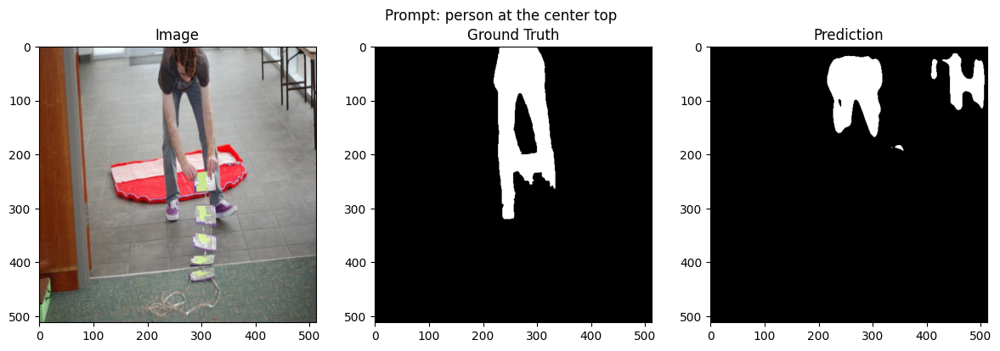


Epoch 2/40


Epoch  2 | Train Loss: 0.6161, Dice: 0.2646, IoU: 0.1700
Val   Loss: 0.6088, Dice: 0.2827, IoU: 0.1817
Best model saved.


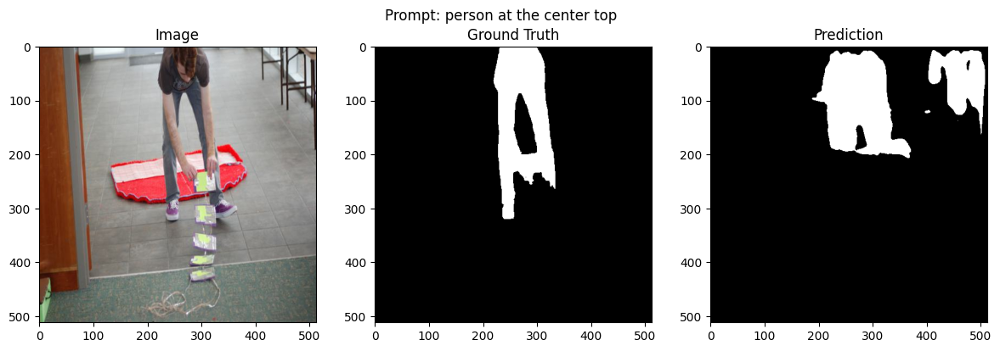


Epoch 3/40


Epoch  3 | Train Loss: 0.5987, Dice: 0.2891, IoU: 0.1879
Val   Loss: 0.6056, Dice: 0.2566, IoU: 0.1643
Best model saved.


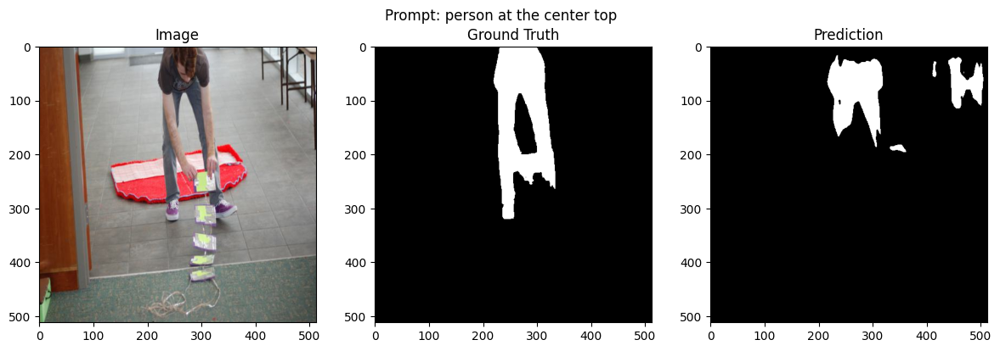


Epoch 4/40


Epoch  4 | Train Loss: 0.5710, Dice: 0.3218, IoU: 0.2118
Val   Loss: 0.5547, Dice: 0.3421, IoU: 0.2261
Best model saved.


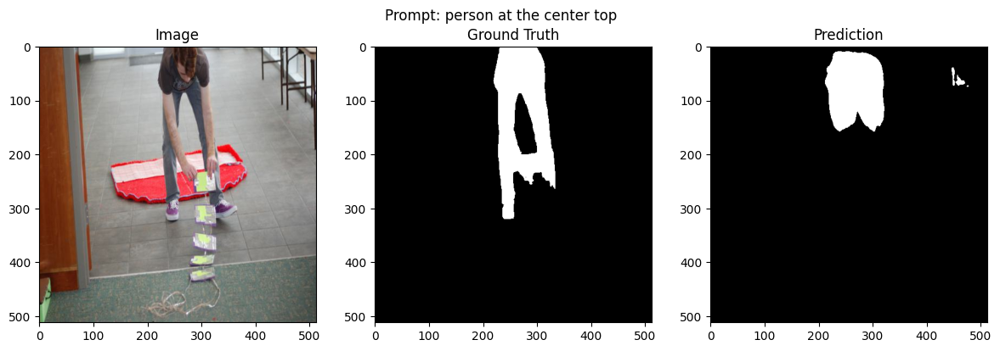


Epoch 5/40


Epoch  5 | Train Loss: 0.5441, Dice: 0.3552, IoU: 0.2364
Val   Loss: 0.5475, Dice: 0.3519, IoU: 0.2331
Best model saved.


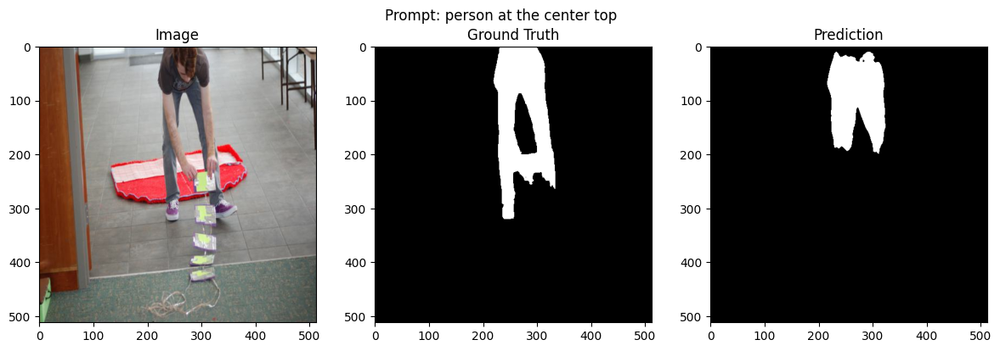


Epoch 6/40


Epoch  6 | Train Loss: 0.5375, Dice: 0.3630, IoU: 0.2425
Val   Loss: 0.5381, Dice: 0.3640, IoU: 0.2431
Best model saved.


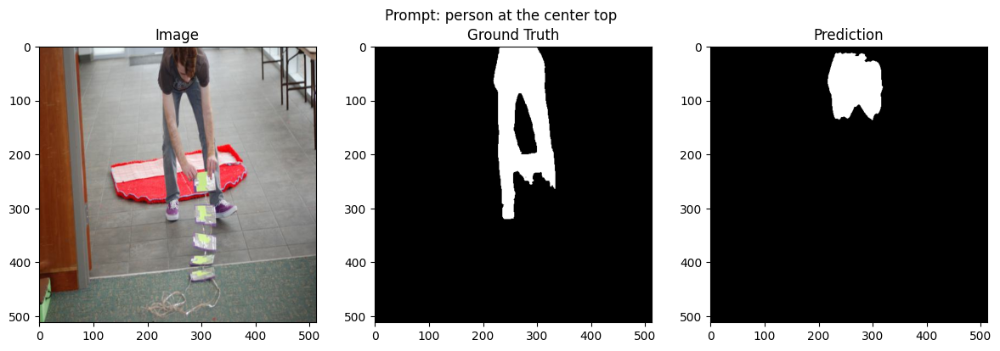


Epoch 7/40


Epoch  7 | Train Loss: 0.5332, Dice: 0.3682, IoU: 0.2473
Val   Loss: 0.5380, Dice: 0.3620, IoU: 0.2405
Best model saved.


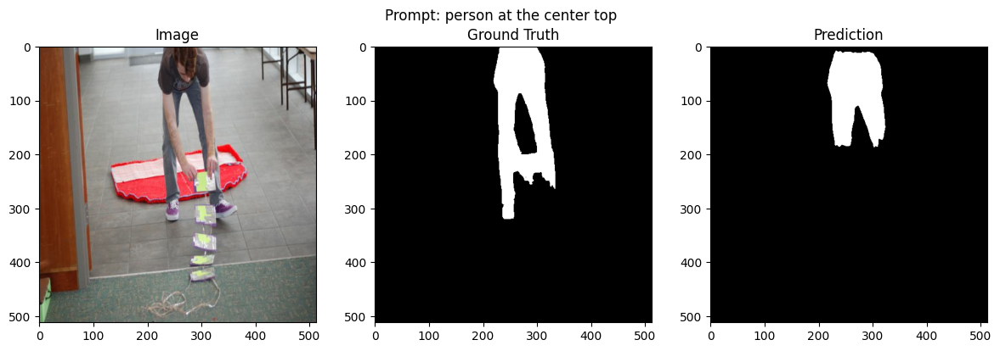


Epoch 8/40


Epoch  8 | Train Loss: 0.5277, Dice: 0.3745, IoU: 0.2524
Val   Loss: 0.5283, Dice: 0.3750, IoU: 0.2513
Best model saved.


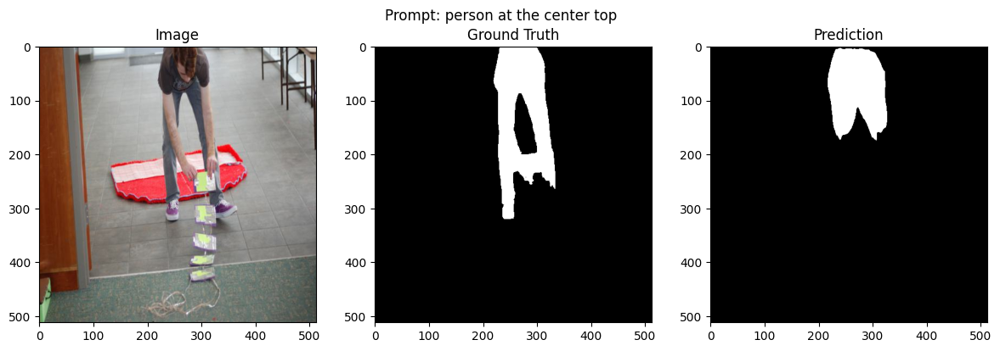


Epoch 9/40


Epoch  9 | Train Loss: 0.5259, Dice: 0.3767, IoU: 0.2545
Val   Loss: 0.5298, Dice: 0.3734, IoU: 0.2506


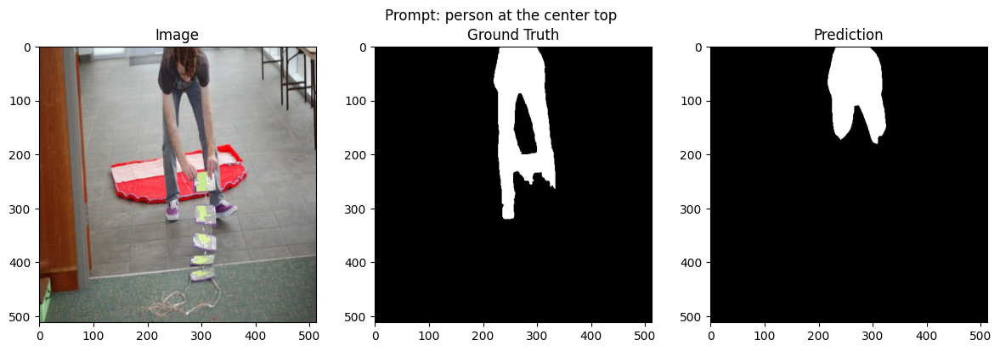


Epoch 10/40


Epoch 10 | Train Loss: 0.5201, Dice: 0.3841, IoU: 0.2607
Val   Loss: 0.5307, Dice: 0.3734, IoU: 0.2515


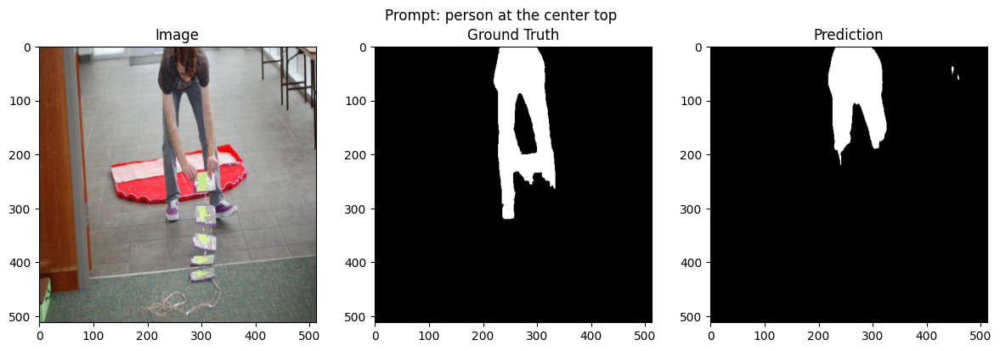


Epoch 11/40


Epoch 11 | Train Loss: 0.5171, Dice: 0.3871, IoU: 0.2632
Val   Loss: 0.5423, Dice: 0.3551, IoU: 0.2388


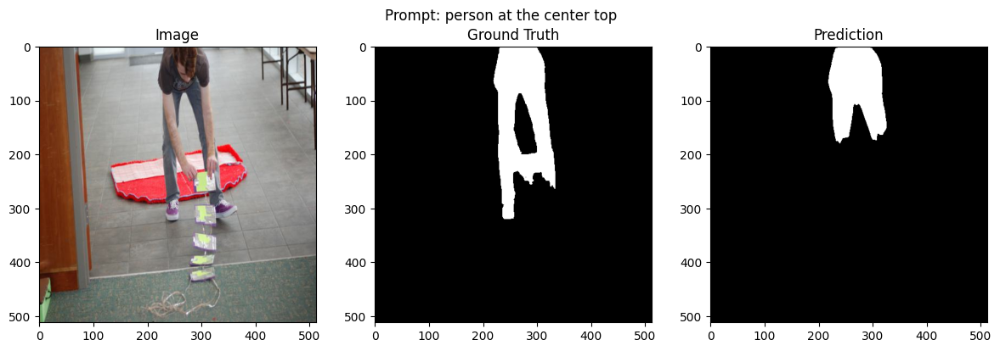


Epoch 12/40


Epoch 12 | Train Loss: 0.5114, Dice: 0.3940, IoU: 0.2693
Val   Loss: 0.5290, Dice: 0.3745, IoU: 0.2540


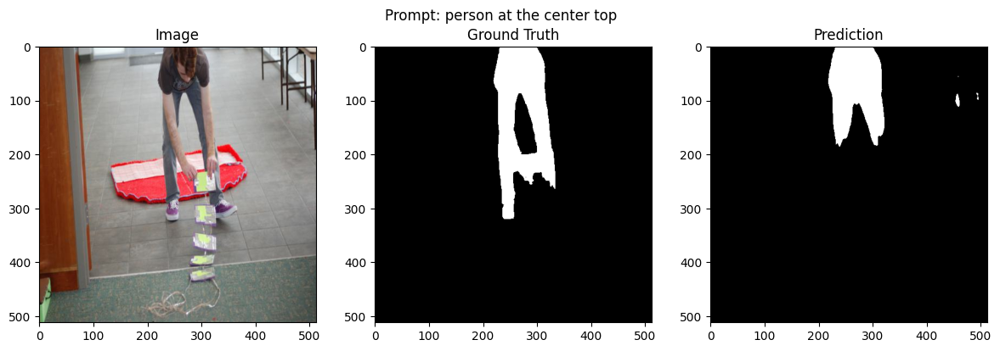


Epoch 13/40


Epoch 13 | Train Loss: 0.4988, Dice: 0.4082, IoU: 0.2813
Val   Loss: 0.5226, Dice: 0.3821, IoU: 0.2596
Best model saved.


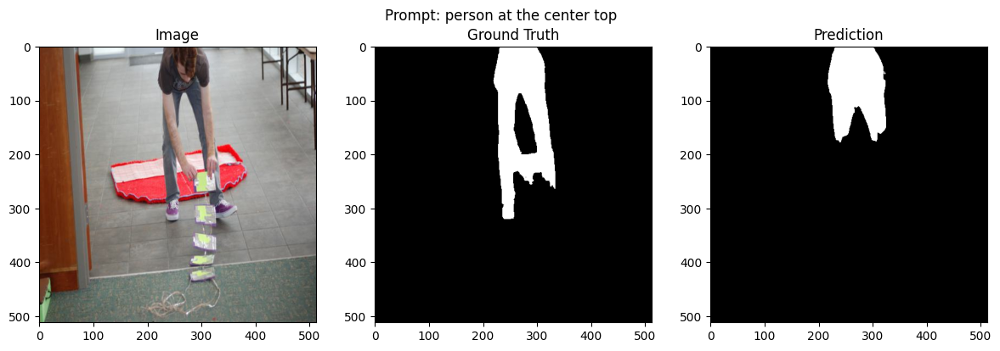


Epoch 14/40


Epoch 14 | Train Loss: 0.4931, Dice: 0.4153, IoU: 0.2879
Val   Loss: 0.5204, Dice: 0.3854, IoU: 0.2625
Best model saved.


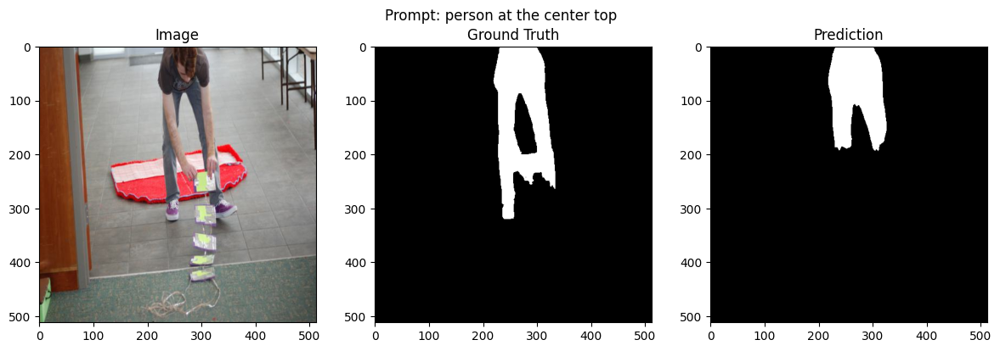


Epoch 15/40


Epoch 15 | Train Loss: 0.4864, Dice: 0.4233, IoU: 0.2947
Val   Loss: 0.5267, Dice: 0.3797, IoU: 0.2587


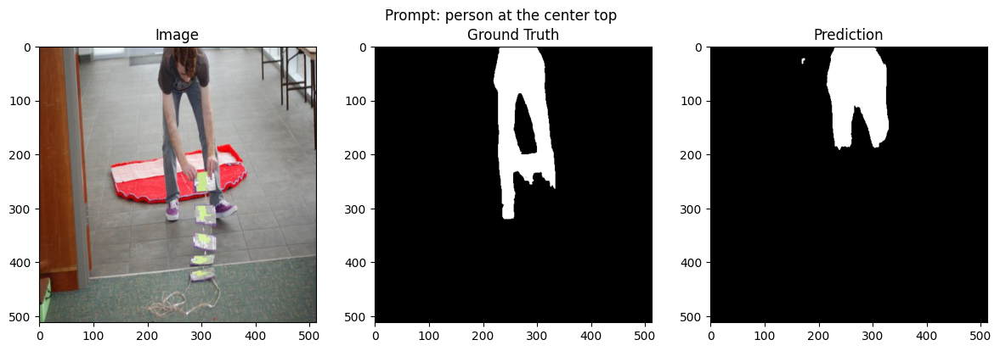


Epoch 16/40


Epoch 16 | Train Loss: 0.4799, Dice: 0.4313, IoU: 0.3020
Val   Loss: 0.5361, Dice: 0.3628, IoU: 0.2462


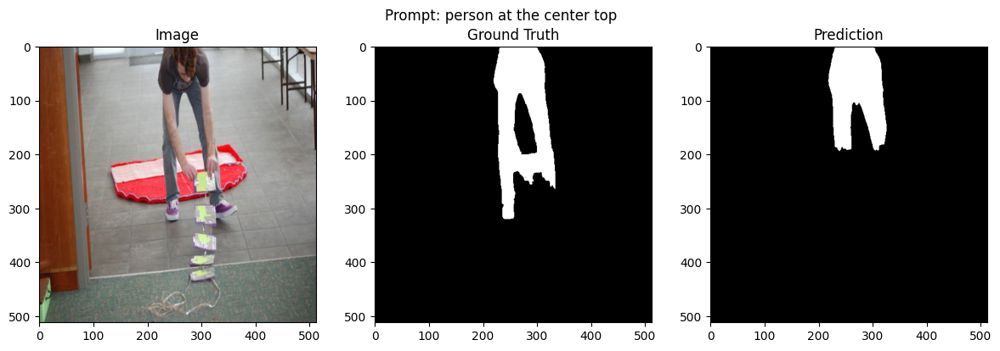


Epoch 17/40


Epoch 17 | Train Loss: 0.4725, Dice: 0.4395, IoU: 0.3094
Val   Loss: 0.5342, Dice: 0.3638, IoU: 0.2467


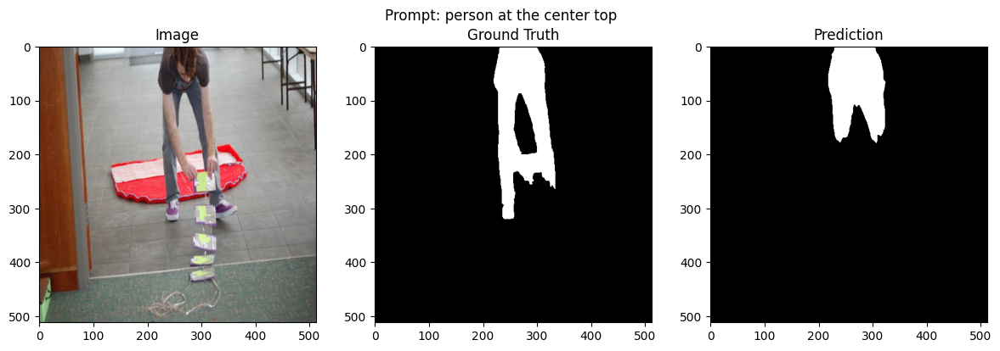


Epoch 18/40


Epoch 18 | Train Loss: 0.4651, Dice: 0.4486, IoU: 0.3173
Val   Loss: 0.5282, Dice: 0.3751, IoU: 0.2555


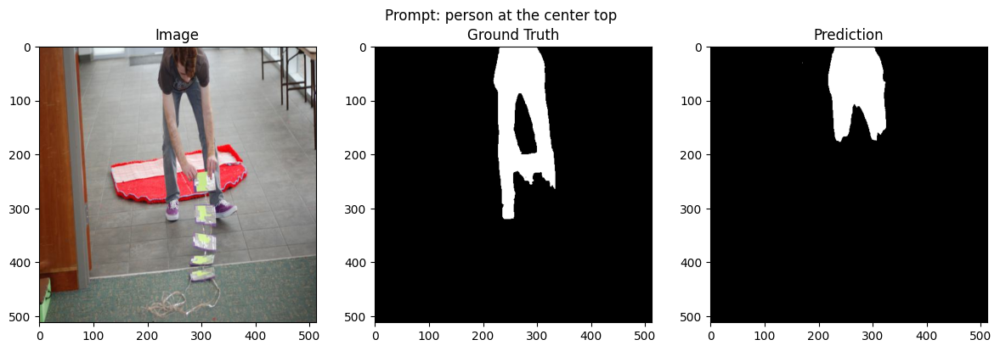


Epoch 19/40


Epoch 19 | Train Loss: 0.4484, Dice: 0.4683, IoU: 0.3355
Val   Loss: 0.5377, Dice: 0.3660, IoU: 0.2494


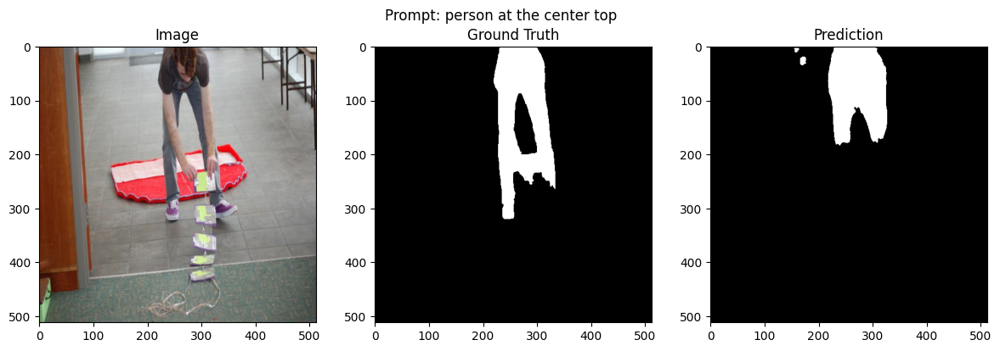


Epoch 20/40


Epoch 20 | Train Loss: 0.4397, Dice: 0.4786, IoU: 0.3448
Val   Loss: 0.5376, Dice: 0.3661, IoU: 0.2493


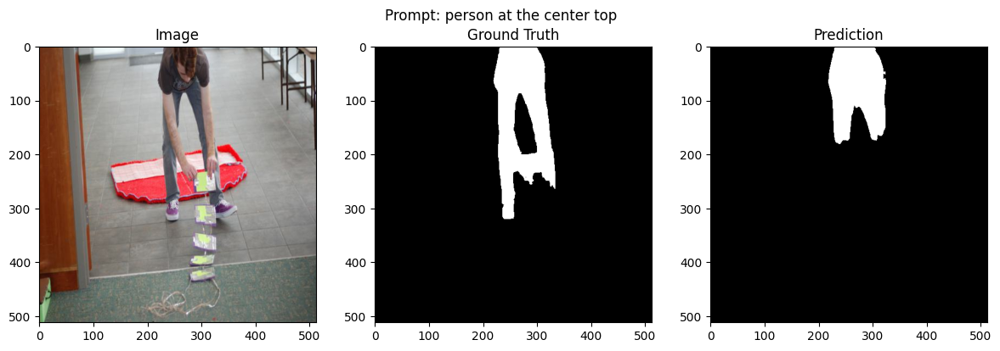


Epoch 21/40


Epoch 21 | Train Loss: 0.4318, Dice: 0.4882, IoU: 0.3538
Val   Loss: 0.5462, Dice: 0.3543, IoU: 0.2407


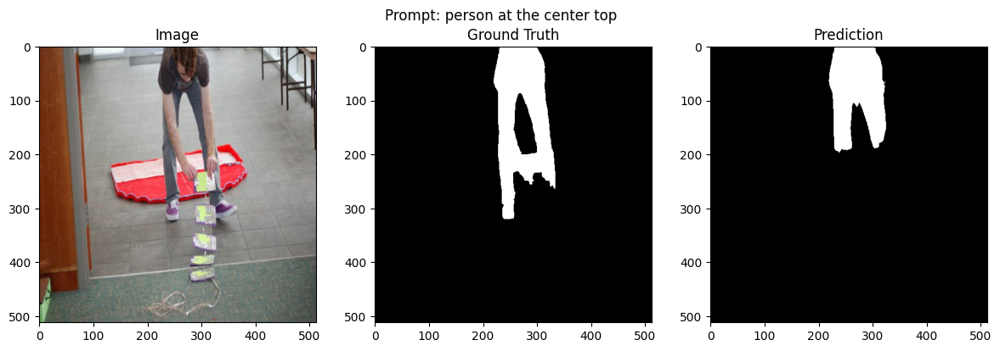


Epoch 22/40


Epoch 22 | Train Loss: 0.4255, Dice: 0.4958, IoU: 0.3606
Val   Loss: 0.5465, Dice: 0.3597, IoU: 0.2448


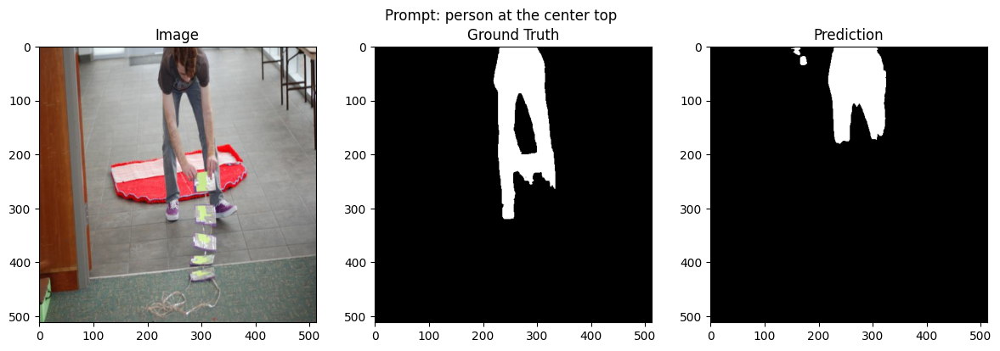


Epoch 23/40


Epoch 23 | Train Loss: 0.4111, Dice: 0.5133, IoU: 0.3768
Val   Loss: 0.5535, Dice: 0.3476, IoU: 0.2362


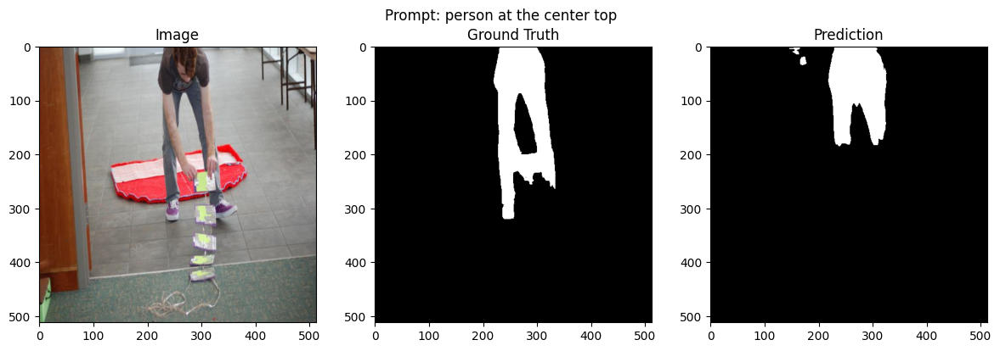


Epoch 24/40


Epoch 24 | Train Loss: 0.4049, Dice: 0.5204, IoU: 0.3836
Val   Loss: 0.5577, Dice: 0.3427, IoU: 0.2330
Early stopping triggered.
Metrics saved to 'metrics.pkl'


In [ ]:
# Train the model
train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    tokenizer=tokenizer,
    device=device,
    epochs=40,
    lr=1e-4	,
    save_path="best_model.pt"
)




*Now that the model is trained, this section focuses on using the best-performing checkpoint to run inference on the validation and test sets. The goal is to generate and save the model's predictions to disk. Crucially, we will save two different types of prediction masks to explore which representation is more effective: the direct pixel-wise output and a simplified bounding box version.*


---

#### $Saving$ $Model$ $Predictions$ 
###### $(Raw$ & $Bounding$ $Boxes)$

---



First, we load the saved weights from our best model checkpoint (`best_model_4_6.pt`) into a new instance of the `ConditionedUNet`. The model is then immediately set to evaluation mode using `model.eval()`. 

In [19]:
# Reload best model
model = ConditionedUNet().to(device)
model.load_state_dict(torch.load("best_model_4_6.pt", map_location=device))
model.eval()

ConditionedUNet(
  (text_encoder): CLIPTextModel(
    (text_model): CLIPTextTransformer(
      (embeddings): CLIPTextEmbeddings(
        (token_embedding): Embedding(49408, 512)
        (position_embedding): Embedding(77, 512)
      )
      (encoder): CLIPEncoder(
        (layers): ModuleList(
          (0-11): 12 x CLIPEncoderLayer(
            (self_attn): CLIPAttention(
              (k_proj): Linear(in_features=512, out_features=512, bias=True)
              (v_proj): Linear(in_features=512, out_features=512, bias=True)
              (q_proj): Linear(in_features=512, out_features=512, bias=True)
              (out_proj): Linear(in_features=512, out_features=512, bias=True)
            )
            (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (mlp): CLIPMLP(
              (activation_fn): QuickGELUActivation()
              (fc1): Linear(in_features=512, out_features=2048, bias=True)
              (fc2): Linear(in_features=2048, out_features=512,

To analyze the model's performance from a different perspective, we will additionally evaluate its ability to correctly locate the object within a bounding box.

To do this, we define a helper function `prediction_to_box_mask`. This function takes the model's raw probability mask and performs the following steps:
1.  It thresholds the prediction to create a binary mask.
2.  It finds the minimum and maximum coordinates of the predicted pixels to define a tight bounding box.
3.  It generates a new, solid rectangular mask that fills this entire bounding box.

This process simplifies the model's prediction to its core localization and scale, ignoring minor imperfections in the predicted shape.


In [ ]:
# Config
base_dir = "/dataset"
pred_dir = os.path.join(base_dir, "predicted_token")  
splits = ["val", "test"]


In [20]:
def prediction_to_box_mask(pred_tensor, threshold=0.4):
    pred_np = (pred_tensor > threshold).cpu().numpy().astype(np.uint8) * 255
    ys, xs = np.where(pred_np > 0)
    if len(xs) == 0 or len(ys) == 0:
        return np.zeros_like(pred_np)
    x1, x2 = xs.min(), xs.max()
    y1, y2 = ys.min(), ys.max()
    box_mask = np.zeros_like(pred_np)
    box_mask[y1:y2+1, x1:x2+1] = 255
    return box_mask

Finally, we loop through all samples in the `val` and `test` datasets. For each sample, we run the model inference. From the output, we generate and save two distinct masks:

* **Raw Mask**: This is the direct, pixel-level prediction from the model after applying a sigmoid and a threshold. 
* **Box Mask**: This is the filled rectangular mask created by our `prediction_to_box_mask` function.


In [ ]:
# You can use val_transform as inference transform
infer_transform = val_transform

# Save predictions
for split in splits:
    print(f"\n→ Inference on {split.upper()} set")

    # Setup output dirs
    raw_dir = os.path.join(pred_dir, split, "raw")
    box_dir = os.path.join(pred_dir, split, "box")
    os.makedirs(raw_dir, exist_ok=True)
    os.makedirs(box_dir, exist_ok=True)

    # Create dataset
    ds = MaskDataset(base_dir, split, transform=infer_transform, tokenizer=tokenizer)

    for i, sample in enumerate(tqdm(ds, desc=f"Processing {split}", leave=False)):
        img = sample["image"].unsqueeze(0).to(device)  # [1, 3, H, W]
        ids = sample["input_ids"].unsqueeze(0).to(device)
        attn = sample["attention_mask"].unsqueeze(0).to(device)

        with torch.no_grad():
            logits = model(img, ids, attn)  # [1,1,H,W]
            prob = torch.sigmoid(logits)[0, 0].cpu()

        # Save raw mask
        raw_mask = (prob > 0.4).numpy().astype(np.uint8) * 255
        raw_fn = f"mask_raw_{ds.ids[i]}.png"
        Image.fromarray(raw_mask).save(os.path.join(raw_dir, raw_fn))

        # Save box mask
        box_mask = prediction_to_box_mask(prob, threshold=0.4)
		
        box_fn = f"mask_box_{ds.ids[i]}.png"
        Image.fromarray(box_mask).save(os.path.join(box_dir, box_fn))

    print(f"✓ Saved {split} predictions to:\n  → {raw_dir}\n  → {box_dir}")



→ Inference on VAL set


Processing val:   0%|          | 0/2250 [00:00<?, ?it/s]

✓ Saved val predictions to:
  → /mnt/windows/datalake/lefki/dataset/predicted_token/val/raw
  → /mnt/windows/datalake/lefki/dataset/predicted_token/val/box

→ Inference on TEST set


✓ Saved test predictions to:
  → /mnt/windows/datalake/lefki/dataset/predicted_token/test/raw
  → /mnt/windows/datalake/lefki/dataset/predicted_token/test/box


---

#### $Predictions$' $Visualization$

---


VAL SPLIT 


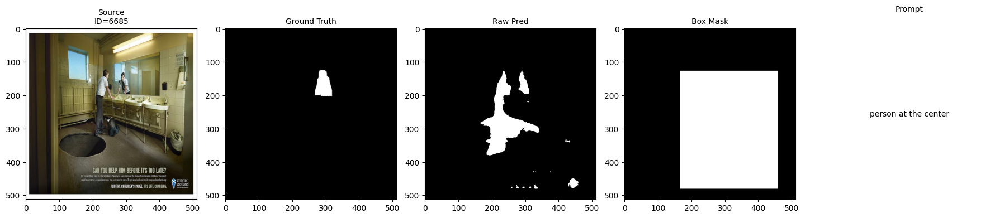

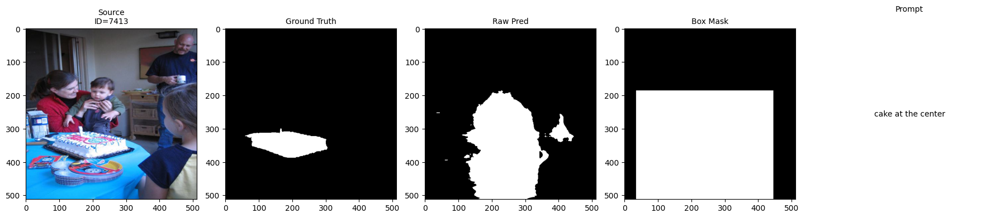

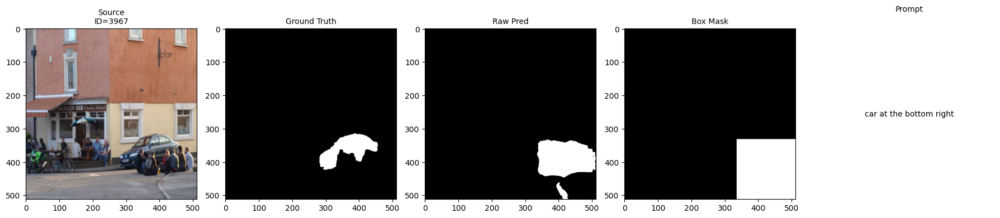

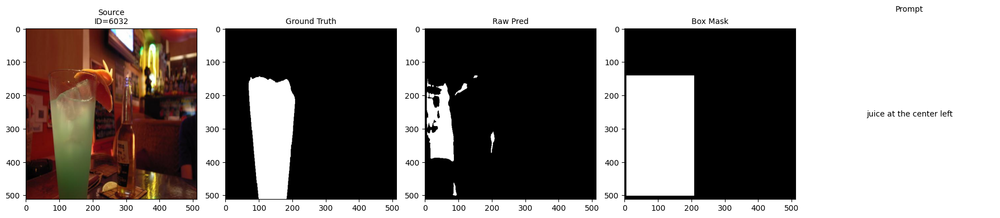

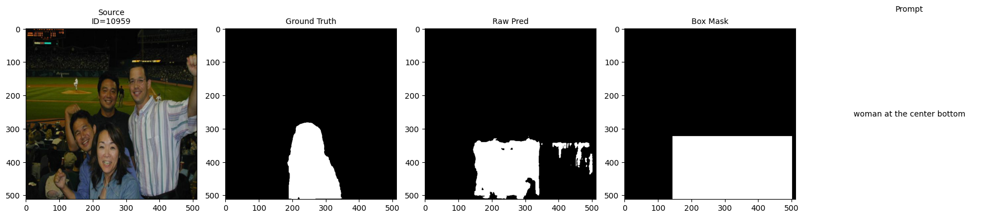

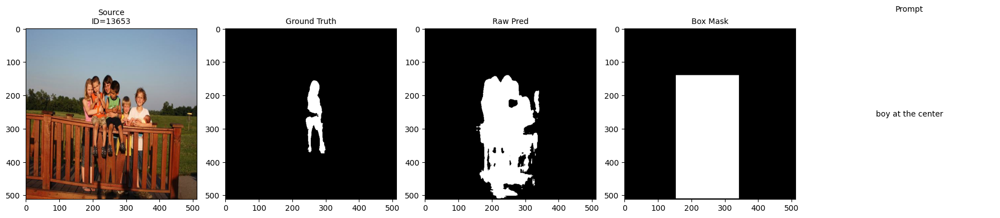

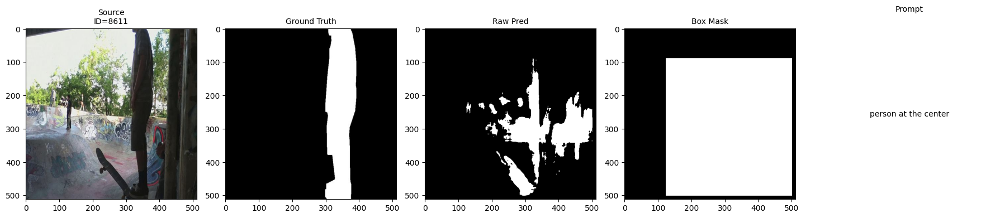

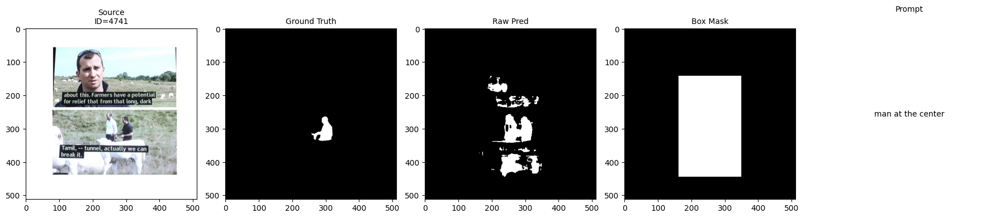

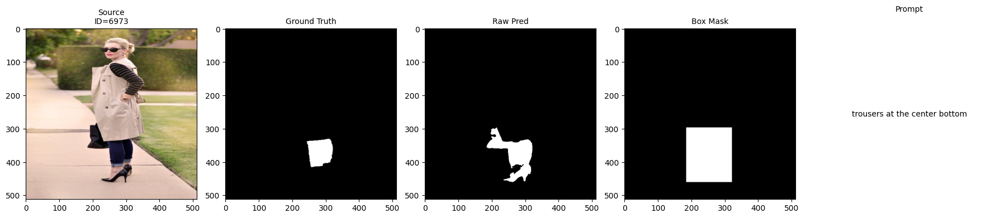

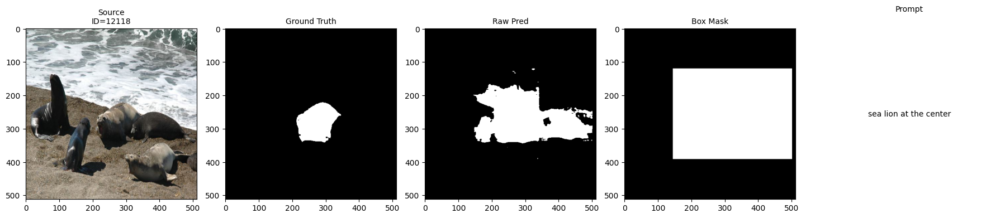


TEST SPLIT 


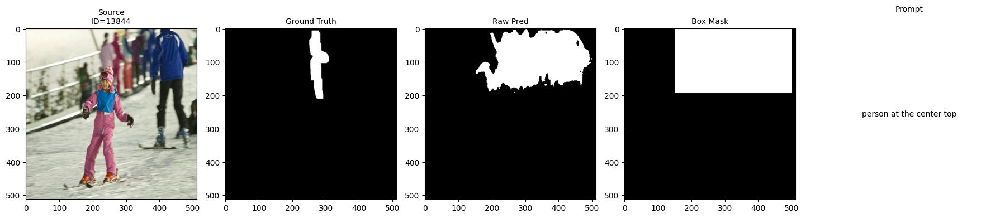

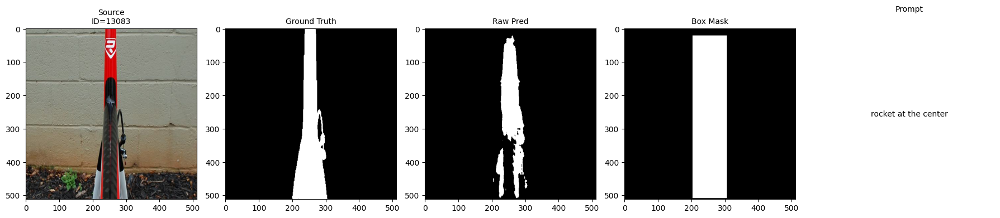

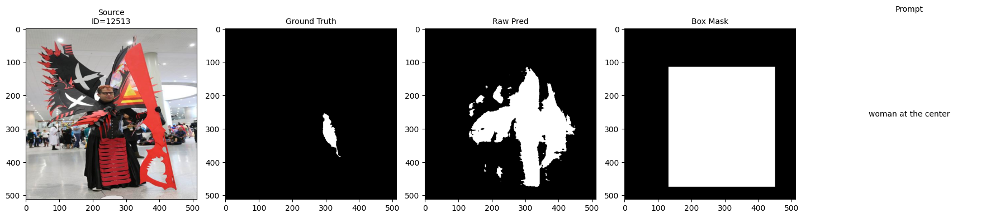

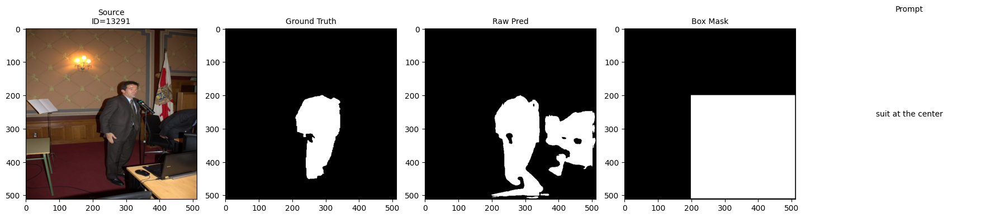

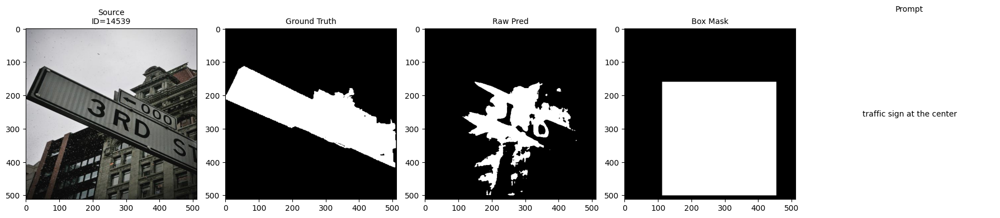

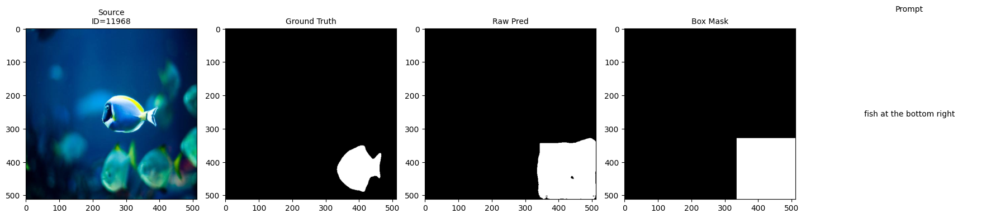

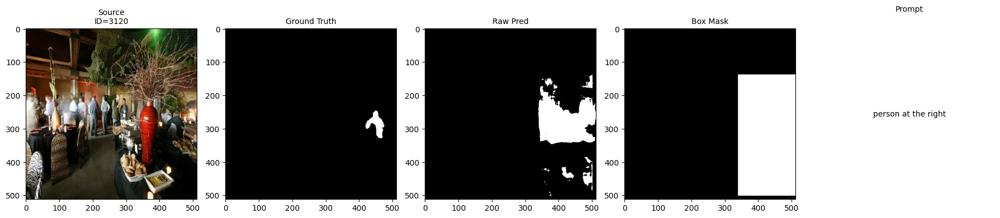

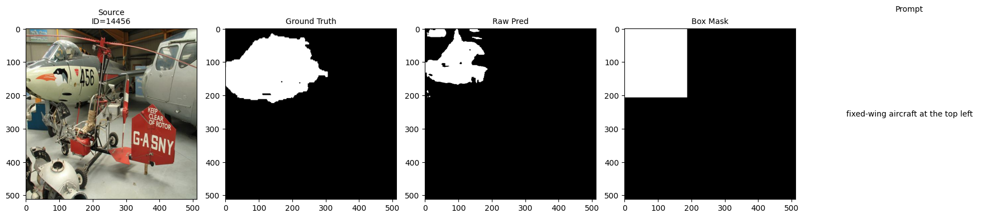

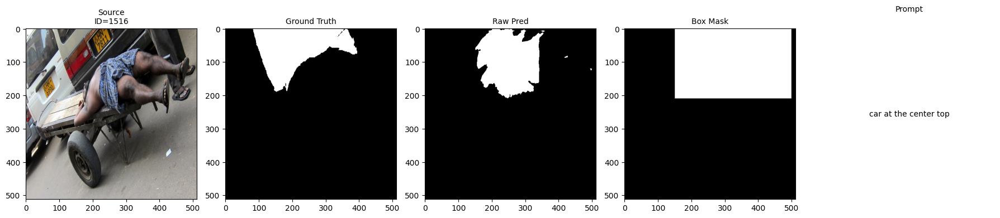

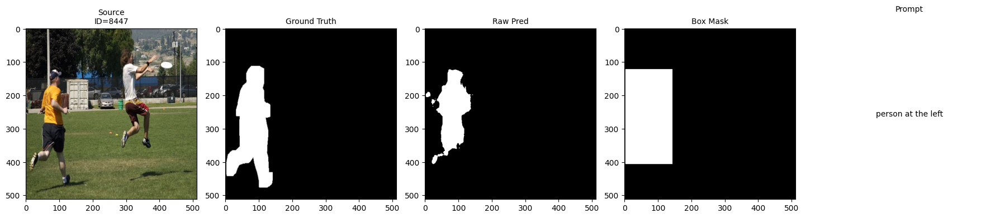

In [ ]:
# Visualization
for split in splits:
    print(f"\n{split.upper()} SPLIT ")
    raw_dir = os.path.join(pred_dir, split, "raw")
    box_dir = os.path.join(pred_dir, split, "box")
    true_dir = os.path.join(base_dir, split, "masks")
    src_dir = os.path.join(base_dir, split, "source_images")
    ins_dir = os.path.join(base_dir, split, "instructions")

    # Get all IDs and pick 10 at random
    try:
        all_ids = [fn.split("_")[2].split(".")[0] for fn in os.listdir(raw_dir) if fn.startswith("mask_raw_")]
    except FileNotFoundError:
        print(f"Missing directory: {raw_dir}")
        continue

    samples = random.sample(all_ids, min(10, len(all_ids)))

    for _id in samples:
        try:
            # Load assets
            src_img = Image.open(os.path.join(src_dir, f"source_img_{_id}.png")).convert("RGB")
            true_mask = Image.open(os.path.join(true_dir, f"mask_{_id}.png")).convert("L")
            raw_mask = Image.open(os.path.join(raw_dir, f"mask_raw_{_id}.png")).convert("L")
            box_mask = Image.open(os.path.join(box_dir, f"mask_box_{_id}.png")).convert("L")
            with open(os.path.join(ins_dir, f"instruction_{_id}.txt"), "r") as f:
                prompt = f.read().strip()

            # Plot
            fig, axs = plt.subplots(1, 5, figsize=(18, 4))
            axs[0].imshow(src_img)
            axs[0].set_title(f"Source\nID={_id}", fontsize=10)
            axs[1].imshow(true_mask, cmap="gray")
            axs[1].set_title("Ground Truth", fontsize=10)
            axs[2].imshow(raw_mask, cmap="gray")
            axs[2].set_title("Raw Pred", fontsize=10)
            axs[3].imshow(box_mask, cmap="gray")
            axs[3].set_title("Box Mask", fontsize=10)

            axs[4].axis("off")
            axs[4].text(0.5, 0.5, prompt, ha="center", va="center", wrap=True, fontsize=10)
            axs[4].set_title("Prompt", fontsize=10)

            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error loading sample {_id}: {e}")


---

#### $Masks$ : $Raw$ $vs.$ $Bounding$ $Boxes$ 

---

The script executes the following steps for each split:
* **Defines Helpers:** Sets up functions to load masks, compute Dice/IoU metrics, and crucially, a function to convert any raw mask into a bounding box mask on-the-fly.
* **Iterates Through Predictions:** Loops over all prediction IDs for the current split.
* **Performs Paired Evaluations:** For each ID, it loads the predicted masks and the ground truth mask. It then:
    1.  Compares the predicted raw mask to the raw ground truth.
    2.  Converts the raw ground truth to a box mask in memory, and compares the predicted box mask against it.
* **Summarizes Results:** After processing all IDs, it calculates and prints the final average Dice and IoU scores for both the "Raw" and "Box" comparisons.

In [21]:
# Mask loading helper
def load_mask_tensor(path):
    mask = np.array(Image.open(path).convert("L"))
    mask_tensor = torch.tensor(mask, dtype=torch.float32).unsqueeze(0).unsqueeze(0) / 255.0  # [1,1,H,W]
    return mask_tensor


In [22]:
def mask_tensor_to_box_tensor(mask_tensor):
    """
    Converts a mask tensor [1,1,H,W] to its tightest bounding box tensor on the same device.
    """
    # Squeeze tensor to a 2D numpy array. Assumes batch size is 1.
    mask_np = mask_tensor.squeeze().cpu().numpy()
    
    # Find coordinates of non-zero pixels
    ys, xs = np.where(mask_np > 0)
    
    # If the mask is empty, return an empty tensor
    if len(xs) == 0 or len(ys) == 0:
        return torch.zeros_like(mask_tensor)
    
    # Get bounding box coordinates
    x1, x2 = xs.min(), xs.max()
    y1, y2 = ys.min(), ys.max()
    
    # Create a new numpy mask for the bounding box
    box_np = np.zeros_like(mask_np)
    box_np[y1:y2+1, x1:x2+1] = 1.0  # Use 1.0 for float tensor
    
    # Convert back to a tensor with the original shape and device
    return torch.from_numpy(box_np).unsqueeze(0).unsqueeze(0).to(mask_tensor.device)


In [23]:
def compute_metrics(pred_mask, true_mask, threshold=0.4, eps=1e-5):
    pred_bin = (pred_mask > threshold).float()
    true_bin = (true_mask > threshold).float()

    intersection = (pred_bin * true_bin).sum(dim=(1, 2, 3))
    union = (pred_bin + true_bin - pred_bin * true_bin).sum(dim=(1, 2, 3))

    dice = (2 * intersection + eps) / (pred_bin.sum(dim=(1, 2, 3)) + true_bin.sum(dim=(1, 2, 3)) + eps)
    iou = (intersection + eps) / (union + eps)

    return {
        "dice": dice.mean().item(),
        "iou": iou.mean().item()
    }


 Evaluating on VAL set 


Evaluating val metrics: 100%|██████████| 2250/2250 [00:05<00:00, 418.75it/s]



 VAL SET METRICS 
→ RAW vs. RAW:   Dice = 0.3855, IoU = 0.2626
→ BOX vs. BOX:   Dice = 0.4292, IoU = 0.3039


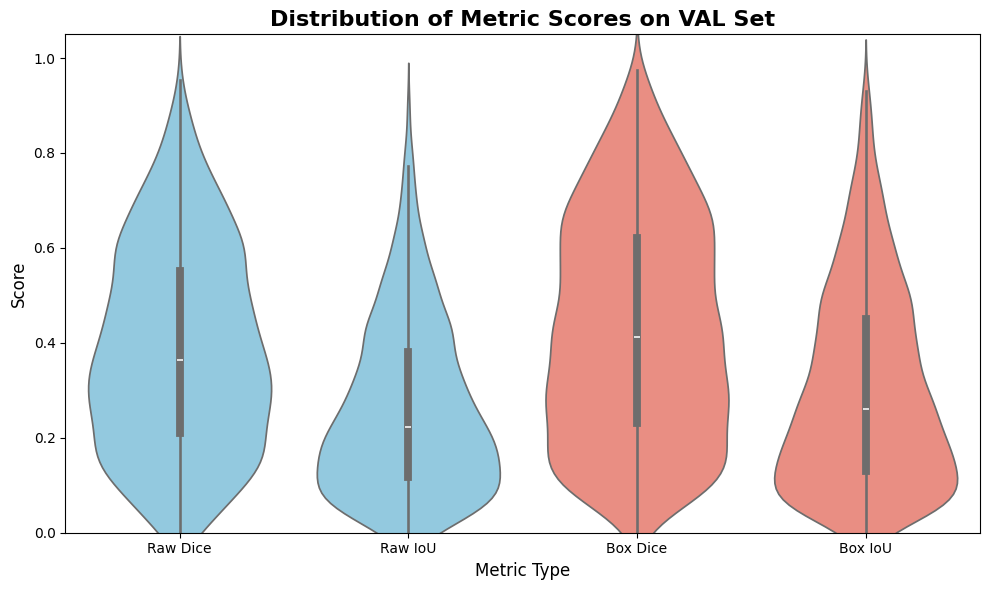

In [ ]:
#  Paths and Setup 
splits = ["val"] 
base_dir = "/dataset"
pred_base_dir = os.path.join(base_dir, "predicted_token")

#  Main Evaluation Loop 
for split in splits:
    print(f" Evaluating on {split.upper()} set ")
    
    gt_dir = os.path.join(base_dir, split, "masks")
    pred_raw_dir = os.path.join(pred_base_dir, split, "raw")
    pred_box_dir = os.path.join(pred_base_dir, split, "box")

    if not os.path.exists(pred_raw_dir) or not os.path.exists(pred_box_dir):
        print(f"Prediction directories not found for '{split}'. Skipping.")
        continue

    ids = [f.split("_")[2].split(".")[0] for f in os.listdir(pred_raw_dir) if f.startswith("mask_raw_")]
    raw_dice_list, raw_iou_list = [], []
    box_dice_list, box_iou_list = [], []

    for _id in tqdm(ids, desc=f"Evaluating {split} metrics"):
        try:
            gt_raw_mask = load_mask_tensor(os.path.join(gt_dir, f"mask_{_id}.png"))
            pred_raw_mask = load_mask_tensor(os.path.join(pred_raw_dir, f"mask_raw_{_id}.png"))
            pred_box_mask = load_mask_tensor(os.path.join(pred_box_dir, f"mask_box_{_id}.png"))
            gt_box_mask = mask_tensor_to_box_tensor(gt_raw_mask)
            
            raw_metrics = compute_metrics(pred_raw_mask, gt_raw_mask)
            raw_dice_list.append(raw_metrics["dice"])
            raw_iou_list.append(raw_metrics["iou"])

            box_metrics = compute_metrics(pred_box_mask, gt_box_mask)
            box_dice_list.append(box_metrics["dice"])
            box_iou_list.append(box_metrics["iou"])
        except Exception as e:
            pass

    # Print Final Results for the split
    if raw_dice_list and box_dice_list:
        print(f"\n {split.upper()} SET METRICS ")
        print(f"→ RAW vs. RAW:   Dice = {np.mean(raw_dice_list):.4f}, IoU = {np.mean(raw_iou_list):.4f}")
        print(f"→ BOX vs. BOX:   Dice = {np.mean(box_dice_list):.4f}, IoU = {np.mean(box_iou_list):.4f}")
        
        # Create DataFrame for seaborn
        data = {
            'Score': raw_dice_list + raw_iou_list + box_dice_list + box_iou_list,
            'Metric': ['Raw Dice'] * len(raw_dice_list) +
                      ['Raw IoU'] * len(raw_iou_list) +
                      ['Box Dice'] * len(box_dice_list) +
                      ['Box IoU'] * len(box_iou_list)
        }
        df = pd.DataFrame(data)
        
        # Plot
        # print(f"\n Generating Visualization for {split.upper()} Set ")
        plt.figure(figsize=(10, 6))
        sns.violinplot(x='Metric', y='Score', data=df, hue='Metric', palette={"Raw Dice": "skyblue", "Raw IoU": "skyblue", "Box Dice": "salmon", "Box IoU": "salmon"}, inner='box',legend=False)
        plt.title(f'Distribution of Metric Scores on {split.upper()} Set', fontsize=16, fontweight='bold')
        plt.ylabel('Score', fontsize=12)
        plt.xlabel('Metric Type', fontsize=12)
        plt.ylim(0, 1.05)
        # plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()
    else:
        print(f"No metrics were calculated for the '{split}' set.")

---

#### $Conslusion$

---


*Based on the performance metrics from the validation set, we will choose the most reliable mask generation method to feed into our diffusion model.*

##### **Summary of Results**

The evaluation clearly shows two different levels of performance:
1.  **Strong Localization:** The "Box vs. Box" metrics are clearly superior. Their distributions are centered significantly higher, with median Dice and IoU scores visibly outperforming the raw metrics. This proves that the model is very effective at understanding the prompt and correctly identifying the general location and scale of the target object.
2.  **Challenging Segmentation:** Conversely, the "Raw vs. Raw" metrics (skyblue plots) show distributions that are wider and heavily skewed towards lower scores. This indicates that while the model can occasionally produce a good pixel-level mask, it struggles with consistency, finding the precise, detailed shape of the object to be a much harder task.

##### **Project Decision**

Based on these results, the **bounding box prediction is the more reliable and robust output** from our detection model.

Therefore, we will proceed using the generated bounding box masks.


---

#### **$Final$ $Model$ $Performance$ $-$ $Test$ $Set$**

---



This final script calculates the performance of our chosen model and "Box vs. Box" strategy on the held-out **test set**. It loads the U-Net's predicted box masks, creates the ground truth box masks on-the-fly, and prints the final, official Dice and IoU scores for the project.

In [ ]:
#  Paths and Setup 
split = "test" 
base_dir = "/dataset"
pred_base_dir = os.path.join(base_dir, "predicted_token") # Using your U-Net's predictions

#  Main Evaluation Logic 
print(f" Calculating FINAL 'Box vs. Box' metrics on {split.upper()} set ")

# Define paths for the test split
gt_dir = os.path.join(base_dir, split, "masks")
pred_box_dir = os.path.join(pred_base_dir, split, "box")

if not os.path.exists(pred_box_dir):
    print(f"Prediction directory not found for '{split}'. Cannot proceed.")
else:
    ids = [f.split("_")[-1].split(".")[0] for f in os.listdir(pred_box_dir) if f.startswith("mask_box_")]
    box_dice_list, box_iou_list = [], []

    for _id in tqdm(ids, desc=f"Evaluating {split} metrics"):
        try:
            # Load the necessary masks for the current ID
            gt_raw_mask = load_mask_tensor(os.path.join(gt_dir, f"mask_{_id}.png"))
            pred_box_mask = load_mask_tensor(os.path.join(pred_box_dir, f"mask_box_{_id}.png"))

            # Generate the ground truth bounding box on-the-fly
            gt_box_mask = mask_tensor_to_box_tensor(gt_raw_mask)
            
            # Calculate Box-to-Box comparison metrics
            box_metrics = compute_metrics(pred_box_mask, gt_box_mask)
            box_dice_list.append(box_metrics["dice"])
            box_iou_list.append(box_metrics["iou"])

        except Exception as e:
            pass

    #  Print Final Results 
    if box_dice_list:
        print(f"\n FINAL MODEL PERFORMANCE ON {split.upper()} SET ")
        print(f"→ BOX vs. BOX:   Dice = {np.mean(box_dice_list):.4f}, IoU = {np.mean(box_iou_list):.4f}")
    else:
        print(f"No metrics were calculated for the '{split}' set.")

 Calculating FINAL 'Box vs. Box' metrics on TEST set 


Evaluating test metrics: 100%|██████████| 1500/1500 [00:02<00:00, 601.59it/s]


 FINAL MODEL PERFORMANCE ON TEST SET 
→ BOX vs. BOX:   Dice = 0.4386, IoU = 0.3118


---

#### $Final$ $Folder$ $Structure$

---

In [ ]:
# Paths and Setup 
base_dir = "/dataset"
pred_token_dir = os.path.join(base_dir, "predicted_token")

# Input: The original ground truth masks for the training set
input_dir = os.path.join(base_dir, "train", "masks")

# Output: The new directory for the ground truth bounding box masks
output_dir = os.path.join(pred_token_dir, "train", "box")

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

mask_files = [f for f in os.listdir(input_dir) if f.endswith('.png')]
print(f"\nFound {len(mask_files)} masks to convert.")


Found 11250 masks to convert.


In [ ]:
# Loop through each mask file, convert it, and save it
for filename in tqdm(mask_files, desc="Converting train masks to boxes"):
    try:
        input_path = os.path.join(input_dir, filename)
        output_path = os.path.join(output_dir, filename)

        # 1. Load the original mask image
        with Image.open(input_path) as img:
            mask_np = np.array(img.convert("L"))

        # 2. Convert to a PyTorch tensor to match the function's input type
        # We normalize to [0, 1] as the function expects probabilities/logits
        mask_tensor = torch.from_numpy(mask_np / 255.0)

        # 3. Call your existing function to create the bounding box mask
        # We use a low threshold (e.g., 0.1) to ensure all non-zero pixels are included
        box_np = prediction_to_box_mask(mask_tensor, threshold=0.1)

        # 4. Save the new bounding box mask
        Image.fromarray(box_np).save(output_path)
        
    except Exception as e:
        print(f"Failed to process {filename}: {e}")

print(f"\n✓ Successfully created bounding box masks for the training set")

Converting train masks to boxes: 100%|██████████| 11250/11250 [00:21<00:00, 519.07it/s]


✓ Successfully created bounding box masks for the training set


```{}
/dataset/
├── train/
│   ├── source_images/
│   ├── target_images/
│   ├── masks/              # Original pixel-level ground truth masks
│   └── instructions/
│
├── val/
│   ├── source_images/
│   ├── target_images/
│   ├── masks/              # Original pixel-level ground truth masks
│   └── instructions/
│
├── test/
│   ├── source_images/
│   ├── target_images/
│   ├── masks/              # Original pixel-level ground truth masks
│   └── instructions/
│
└── predicted_token/
    ├── train/
    │   └── box/              # Bounding box GT masks for training the inpainter
    │
    ├── val/
    │   ├── raw/              # Model's raw predicted masks (for eval)
    │   └── box/              # Model's box predicted masks (for eval)
    │
    └── test/
        ├── raw/              # Model's raw predicted masks (for eval)
        └── box/              # Model's box predicted masks (for eval)

```


---

#### $CLIPSeg$

---

*To provide a strong point of comparison for our custom model, this section details the complete evaluation of a pre-trained baseline: `CLIPSeg`. The following workflow will generate predictions from the baseline, visualize a few examples for a qualitative assessment, and finally, compute the quantitative metrics. This will give us the benchmark scores needed to contextualize our own model's performance.*


The first script loads the pre-trained `CLIPSeg` model and its processor from Hugging Face. It then iterates through our `val` and `test` sets. For each image and text prompt, it performs inference and saves two distinct types of prediction masks to a new `/predicted_clipseg/` directory:
* **Raw Masks**: The direct, pixel-level binary mask produced by the model after thresholding. This represents CLIPSeg's attempt at precise segmentation.
* **Box Masks**: A simplified bounding box representation of the raw mask. This is generated for a fair comparison against our own model's localization performance.



   - *Note: The threshold used, was tested for several values. This value gave the best metrics.*

In [25]:
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined", use_fast=True)
clipseg = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined").to(device)
clipseg.eval()

CLIPSegForImageSegmentation(
  (clip): CLIPSegModel(
    (text_model): CLIPSegTextTransformer(
      (embeddings): CLIPSegTextEmbeddings(
        (token_embedding): Embedding(49408, 512)
        (position_embedding): Embedding(77, 512)
      )
      (encoder): CLIPSegEncoder(
        (layers): ModuleList(
          (0-11): 12 x CLIPSegEncoderLayer(
            (self_attn): CLIPSegAttention(
              (k_proj): Linear(in_features=512, out_features=512, bias=True)
              (v_proj): Linear(in_features=512, out_features=512, bias=True)
              (q_proj): Linear(in_features=512, out_features=512, bias=True)
              (out_proj): Linear(in_features=512, out_features=512, bias=True)
            )
            (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (mlp): CLIPSegMLP(
              (activation_fn): QuickGELUActivation()
              (fc1): Linear(in_features=512, out_features=2048, bias=True)
              (fc2): Linear(in_features=20

In [ ]:
base_dir = "/dataset"
splits = ["val", "test"]

In [ ]:
# Inference loop
for split in splits:
    print(f"\n→ CLIPSeg Inference on {split.upper()} set")

    src_dir = os.path.join(base_dir, split, "source_images")
    ins_dir = os.path.join(base_dir, split, "instructions")
    
    # Define all output directories
    pred_base_dir = os.path.join(base_dir, "predicted_clipseg", split)
    raw_dir = os.path.join(pred_base_dir, "raw")
    box_dir = os.path.join(pred_base_dir, "box")

    # Create all output directories
    os.makedirs(raw_dir, exist_ok=True)
    os.makedirs(box_dir, exist_ok=True)

    ids = sorted(f.split("_")[-1].split(".")[0] for f in os.listdir(src_dir) if f.startswith("source_img_"))

    for _id in tqdm(ids, desc=f"{split.upper()} - CLIPSeg Inference"):
        try:
            img_path = os.path.join(src_dir, f"source_img_{_id}.png")
            ins_path = os.path.join(ins_dir, f"instruction_{_id}.txt")

            img = Image.open(img_path).convert("RGB")
            prompt = open(ins_path).read().strip()

            inputs = processor(text=prompt, images=img, return_tensors="pt").to(device)

            with torch.no_grad():
                outputs = clipseg(**inputs)

            logits = outputs.logits
            if logits.ndim == 2:
                logits = logits.unsqueeze(0).unsqueeze(0)
            elif logits.ndim == 3:
                logits = logits.unsqueeze(1)
            
            # Resize the probability map to a standard size
            prob_resized = F.interpolate(
                torch.sigmoid(logits),
                size=(512, 512),
                mode="bilinear",
                align_corners=False
            )[0, 0].cpu().numpy()
            
            # The .npy probability files are no longer saved

            # 1. Save the raw binarized mask
            threshold = 0.2
            bin_mask = (prob_resized > threshold).astype(np.uint8) * 255
            Image.fromarray(bin_mask).save(os.path.join(raw_dir, f"mask_raw_{_id}.png"))

            # 2. Create and save the bounding box mask
            ys, xs = np.where(bin_mask > 0)
            if len(xs) > 0 and len(ys) > 0:
                x1, x2 = xs.min(), xs.max()
                y1, y2 = ys.min(), ys.max()
                box_mask = np.zeros_like(bin_mask, dtype=np.uint8)
                box_mask[y1:y2+1, x1:x2+1] = 255
            else:
                box_mask = np.zeros_like(bin_mask, dtype=np.uint8)
            
            Image.fromarray(box_mask).save(os.path.join(box_dir, f"mask_box_{_id}.png"))

        except Exception as e:
            print(f"Failed to process ID {_id}: {e}")


→ CLIPSeg Inference on VAL set


VAL - CLIPSeg Inference: 100%|██████████| 2250/2250 [00:47<00:00, 47.86it/s]



→ CLIPSeg Inference on TEST set


TEST - CLIPSeg Inference: 100%|██████████| 1500/1500 [00:31<00:00, 47.26it/s]


---

#### $CLIPSeg's$ $Predictions$

---

 This second script visualizes the outputs generated in the previous step. It randomly selects a few samples from both the `val` and `test` sets and creates a side-by-side plot comparing:
1.  The original source image.
2.  The ground truth mask.
3.  The predicted raw mask from CLIPSeg.
4.  The predicted box mask from CLIPSeg.


Displaying 3 random samples from the 'VAL' set...


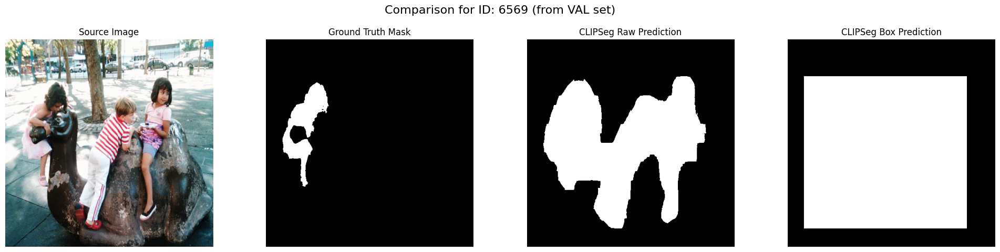

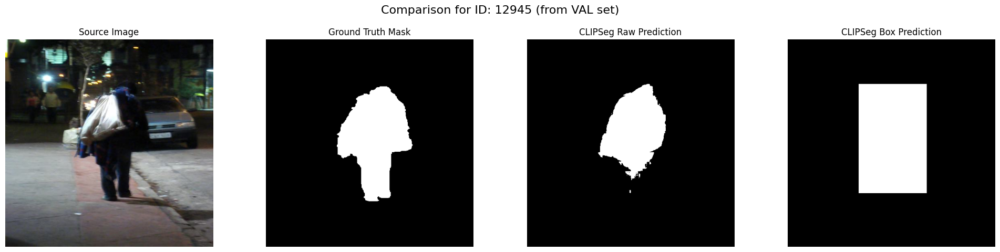

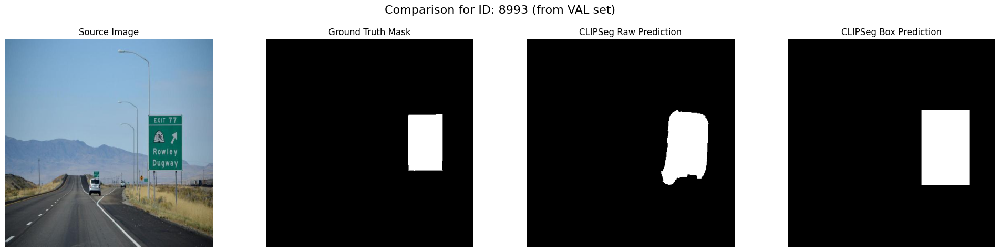

Displaying 3 random samples from the 'TEST' set...


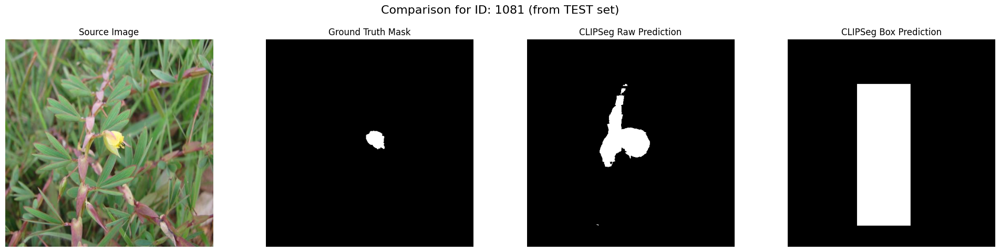

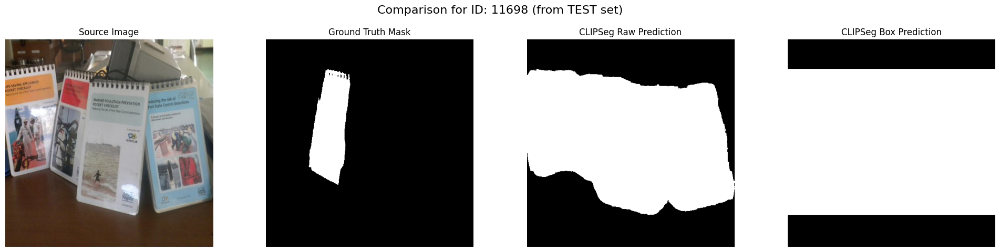

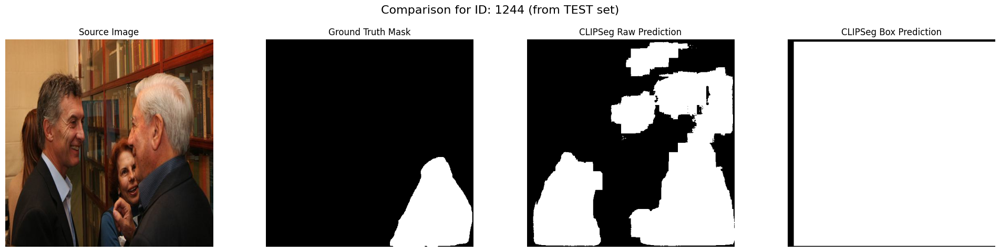

In [ ]:
#  Configuration 
splits_to_visualize = ['val', 'test'] 
num_samples_to_show = 3 # Show 3 samples from each split

base_dir = "/dataset"
pred_base_dir = os.path.join(base_dir, "predicted_clipseg")

#  Main loop to iterate through 'val' and 'test' 
for split in splits_to_visualize:
    

    print(f"Displaying {num_samples_to_show} random samples from the '{split.upper()}' set...")

    #  Define all necessary paths for the current split 
    src_dir = os.path.join(base_dir, split, "source_images")
    gt_dir = os.path.join(base_dir, split, "masks")
    pred_raw_dir = os.path.join(pred_base_dir, split, "raw")
    pred_box_dir = os.path.join(pred_base_dir, split, "box")

    try:
        # Get a list of all available prediction IDs for the current split
        all_ids = [f.split("_")[-1].split(".")[0] for f in os.listdir(pred_raw_dir) if f.startswith("mask_raw_")]

        if not all_ids:
            print(f"No predictions found for the '{split}' set.")
            continue # Move to the next split
            
        # Select a few random samples to display
        if len(all_ids) < num_samples_to_show:
            print(f"Warning: Found only {len(all_ids)} samples, showing all of them.")
            samples_to_show_count = len(all_ids)
        else:
            samples_to_show_count = num_samples_to_show
            
        selected_ids = random.sample(all_ids, samples_to_show_count)

        # Loop through the selected IDs and plot
        for _id in selected_ids:
            try:
                # Construct the full paths for all images
                src_path = os.path.join(src_dir, f"source_img_{_id}.png")
                gt_path = os.path.join(gt_dir, f"mask_{_id}.png")
                pred_raw_path = os.path.join(pred_raw_dir, f"mask_raw_{_id}.png")
                pred_box_path = os.path.join(pred_box_dir, f"mask_box_{_id}.png")

                # Load all images
                src_img = Image.open(src_path).convert("RGB")
                gt_mask = Image.open(gt_path).convert("L")
                pred_raw_mask = Image.open(pred_raw_path).convert("L")
                pred_box_mask = Image.open(pred_box_path).convert("L")

                # Create the plot
                fig, axs = plt.subplots(1, 4, figsize=(20, 5))
                fig.suptitle(f'Comparison for ID: {_id} (from {split.upper()} set)', fontsize=16)

                axs[0].imshow(src_img); axs[0].set_title("Source Image"); axs[0].axis('off')
                axs[1].imshow(gt_mask, cmap='gray'); axs[1].set_title("Ground Truth Mask"); axs[1].axis('off')
                axs[2].imshow(pred_raw_mask, cmap='gray'); axs[2].set_title("CLIPSeg Raw Prediction"); axs[2].axis('off')
                axs[3].imshow(pred_box_mask, cmap='gray'); axs[3].set_title("CLIPSeg Box Prediction"); axs[3].axis('off')

                plt.tight_layout(rect=[0, 0.03, 1, 0.95])
                plt.show()

            except FileNotFoundError as e:
                print(f"Could not load all files for ID {_id} in split '{split}'. Skipping. Details: {e}")
            except Exception as e:
                print(f"An error occurred while processing ID {_id} in split '{split}': {e}")

    except FileNotFoundError:
        print(f"Error: A directory was not found for the '{split}' split.")
        print(f"Please check if this path is correct: {pred_raw_dir}")

---

#### $CLIPSeg$ $Evaluation$
---

This script performs the quantitative evaluation of a segmentation model (specifically one with 'token' predictions, as suggested by `predicted_token` in the code).

It focuses on the validation set, loading the saved raw and box predictions. For these predictions, it computes Dice and IoU scores for both "Raw vs. Raw" (raw prediction against raw ground truth) and "Box vs. Box" (predicted bounding box mask against ground truth bounding box mask) comparisons.

The script then prints the average metrics for the validation set. Finally, a violin plot is generated to visualize the distribution of these metrics, aiding in the analysis of the model's performance on the validation data.

Based on this analysis, the 'box masks' are chosen, likely indicating their superior performance or suitability for the downstream task.

 Evaluating on VAL set 


Evaluating val metrics: 100%|██████████| 2250/2250 [00:05<00:00, 419.32it/s]



 VAL SET METRICS 
→ RAW vs. RAW:    Dice = 0.3598, IoU = 0.2696
→ BOX vs. BOX:    Dice = 0.3663, IoU = 0.2783


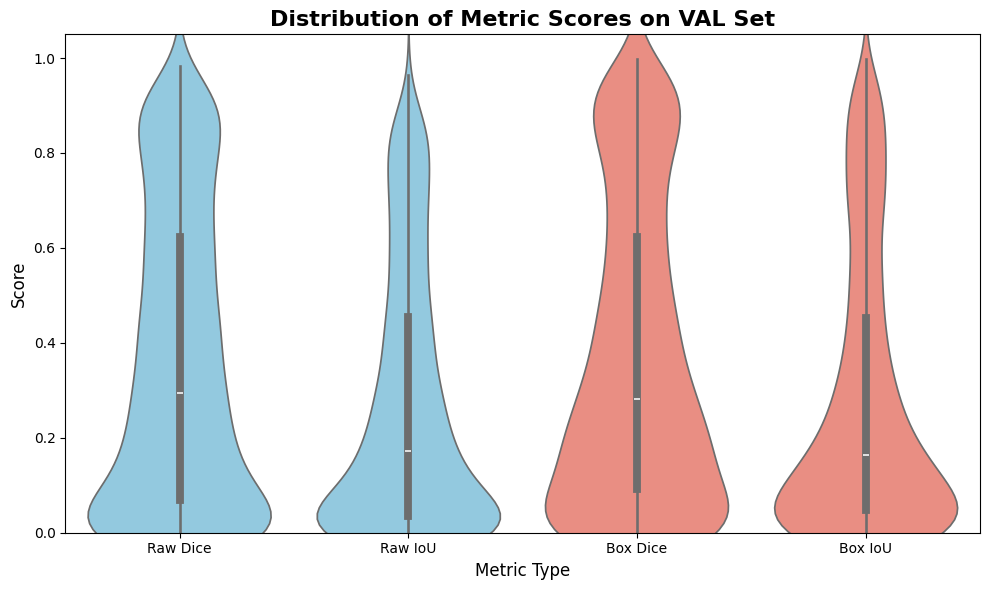

In [ ]:
# Paths and Setup
splits = ["val"]
base_dir = "/dataset"
pred_base_dir = os.path.join(base_dir, "predicted_clipseg")

# Main Evaluation Loop
for split in splits:
    print(f" Evaluating on {split.upper()} set ")

    gt_dir = os.path.join(base_dir, split, "masks")
    pred_raw_dir = os.path.join(pred_base_dir, split, "raw")
    pred_box_dir = os.path.join(pred_base_dir, split, "box")

    if not os.path.exists(pred_raw_dir) or not os.path.exists(pred_box_dir):
        print(f"Prediction directories not found for '{split}'. Skipping.")
        continue

    ids = [f.split("_")[2].split(".")[0] for f in os.listdir(pred_raw_dir) if f.startswith("mask_raw_")]
    raw_dice_list, raw_iou_list = [], []
    box_dice_list, box_iou_list = [], []

    for _id in tqdm(ids, desc=f"Evaluating {split} metrics"):
        try:
            gt_raw_mask = load_mask_tensor(os.path.join(gt_dir, f"mask_{_id}.png"))
            pred_raw_mask = load_mask_tensor(os.path.join(pred_raw_dir, f"mask_raw_{_id}.png"))
            pred_box_mask = load_mask_tensor(os.path.join(pred_box_dir, f"mask_box_{_id}.png"))
            gt_box_mask = mask_tensor_to_box_tensor(gt_raw_mask)

            raw_metrics = compute_metrics(pred_raw_mask, gt_raw_mask)
            raw_dice_list.append(raw_metrics["dice"])
            raw_iou_list.append(raw_metrics["iou"])

            box_metrics = compute_metrics(pred_box_mask, gt_box_mask)
            box_dice_list.append(box_metrics["dice"])
            box_iou_list.append(box_metrics["iou"])
        except Exception as e:
            pass

    # Print Final Results for the split
    if raw_dice_list and box_dice_list:
        print(f"\n {split.upper()} SET METRICS ")
        print(f"→ RAW vs. RAW:    Dice = {np.mean(raw_dice_list):.4f}, IoU = {np.mean(raw_iou_list):.4f}")
        print(f"→ BOX vs. BOX:    Dice = {np.mean(box_dice_list):.4f}, IoU = {np.mean(box_iou_list):.4f}")

        # Create DataFrame for seaborn
        data = {
            'Score': raw_dice_list + raw_iou_list + box_dice_list + box_iou_list,
            'Metric': ['Raw Dice'] * len(raw_dice_list) +
                      ['Raw IoU'] * len(raw_iou_list) +
                      ['Box Dice'] * len(box_dice_list) +
                      ['Box IoU'] * len(box_iou_list)
        }
        df = pd.DataFrame(data)

        # Plot
        plt.figure(figsize=(10, 6))
        sns.violinplot(x='Metric', y='Score', data=df, hue='Metric', palette={"Raw Dice": "skyblue", "Raw IoU": "skyblue", "Box Dice": "salmon", "Box IoU": "salmon"}, inner='box',legend=False)
        plt.title(f'Distribution of Metric Scores on {split.upper()} Set', fontsize=16, fontweight='bold')
        plt.ylabel('Score', fontsize=12)
        plt.xlabel('Metric Type', fontsize=12)
        plt.ylim(0, 1.05)
        plt.tight_layout()
        plt.show()
    else:
        print(f"No metrics were calculated for the '{split}' set.")

#### **Output Description and Rationale for Box Mask Selection**

The output from the initial validation set evaluation includes the average Dice and IoU scores for both "Raw vs. Raw" and "Box vs. Box" comparisons, along with a violin plot illustrating their distributions.

Based on this comprehensive evaluation on the validation set, the **box masks will be selected for the final model performance assessment on the test set.** This decision is driven by the observation that the "Box vs. Box" metrics on the validation set showed **slightly superior or comparable performance** (e.g., Dice = 0.3663, IoU = 0.2783 for Box vs. Dice = 0.3598, IoU = 0.2696 for Raw). 



-----

#### **$CLIPSeg$ $Model$ $Performance$ $-$ $Test$ $Set$**

-----


This section focuses on the final evaluation of the chosen model's performance on the unseen **test set**. Given the insights from the validation phase, the evaluation specifically targets the "Box vs. Box" comparison, as it aligns with the selected mask type for final assessment.

The average Dice and IoU scores for the "Box vs. Box" comparison on the test set are calculated and printed. These metrics represent the ultimate performance of the model on unseen data, providing a robust measure of its generalization capabilities for object localization.



In [ ]:
# Paths and Setup
split = "test"
base_dir = "/dataset"
pred_base_dir = os.path.join(base_dir, "predicted_clipseg") 
# Main Evaluation Logic
print(f" Calculating FINAL 'Box vs. Box' metrics on {split.upper()} set ")

# Define paths for the test split
gt_dir = os.path.join(base_dir, split, "masks")
pred_box_dir = os.path.join(pred_base_dir, split, "box")

if not os.path.exists(pred_box_dir):
    print(f"Prediction directory not found for '{split}'. Cannot proceed.")
else:
    ids = [f.split("_")[-1].split(".")[0] for f in os.listdir(pred_box_dir) if f.startswith("mask_box_")]
    box_dice_list, box_iou_list = [], []

    for _id in tqdm(ids, desc=f"Evaluating {split} metrics"):
        try:
            # Load the necessary masks for the current ID
            gt_raw_mask = load_mask_tensor(os.path.join(gt_dir, f"mask_{_id}.png"))
            pred_box_mask = load_mask_tensor(os.path.join(pred_box_dir, f"mask_box_{_id}.png"))

            # Generate the ground truth bounding box on-the-fly
            gt_box_mask = mask_tensor_to_box_tensor(gt_raw_mask)

            # Calculate Box-to-Box comparison metrics
            box_metrics = compute_metrics(pred_box_mask, gt_box_mask)
            box_dice_list.append(box_metrics["dice"])
            box_iou_list.append(box_metrics["iou"])

        except Exception as e:
            pass

    # Print Final Results
    if box_dice_list:
        print(f"\n FINAL MODEL PERFORMANCE ON {split.upper()} SET ")
        print(f"→ BOX vs. BOX:    Dice = {np.mean(box_dice_list):.4f}, IoU = {np.mean(box_iou_list):.4f}")
    else:
        print(f"No metrics were calculated for the '{split}' set.")

 Calculating FINAL 'Box vs. Box' metrics on TEST set 


Evaluating test metrics: 100%|██████████| 1500/1500 [00:02<00:00, 609.98it/s]


 FINAL MODEL PERFORMANCE ON TEST SET 
→ BOX vs. BOX:    Dice = 0.3736, IoU = 0.2821


---

#### $CLIPSeg$ $vs.$ $UNet$

---

This script performs the head-to-head comparison between our U-Net and the CLIPSeg baseline on the validation set. It calculates the "Box vs. Box" metrics for both models, then generates a final split violin plot to visually compare their performance distributions and select the superior model.

In [ ]:
# Metric Comparison for Validation Set
models_to_evaluate = {
    "U-Net": "predicted_token",
    "CLIPSeg": "predicted_clipseg"
}
split_to_evaluate = "val" 
base_dir = "/dataset"
val_results = {} # Dictionary to store the validation scores

for model_name, pred_folder in models_to_evaluate.items():
    print(f"\n Evaluating [{model_name}] on [{split_to_evaluate.upper()}] set ")
    
    gt_dir = os.path.join(base_dir, split_to_evaluate, "masks")
    pred_box_dir = os.path.join(base_dir, pred_folder, split_to_evaluate, "box")

    if not os.path.exists(pred_box_dir):
        print(f"Prediction directory not found. Skipping.")
        val_results[model_name] = {"Dice": [], "IoU": []}
        continue
        
    ids = [f.split("_")[-1].split(".")[0] for f in os.listdir(pred_box_dir)]
    box_dice_list, box_iou_list = [], []

    for _id in tqdm(ids, desc=f"Calculating {model_name} ({split_to_evaluate})"):
        try:
            gt_raw_mask = load_mask_tensor(os.path.join(gt_dir, f"mask_{_id}.png"))
            pred_box_mask = load_mask_tensor(os.path.join(pred_box_dir, f"mask_box_{_id}.png"))
            gt_box_mask = mask_tensor_to_box_tensor(gt_raw_mask)
            
            metrics = compute_metrics(pred_box_mask, gt_box_mask)
            box_dice_list.append(metrics["dice"])
            box_iou_list.append(metrics["iou"])
        except Exception as e:
            pass
    
    # Store the full list of scores
    val_results[model_name] = { "Dice": box_dice_list, "IoU": box_iou_list }
    
    mean_dice = np.mean(box_dice_list) if box_dice_list else 0
    mean_iou = np.mean(box_iou_list) if box_iou_list else 0
    print(f"✓ [{model_name} | {split_to_evaluate.upper()}] Mean Dice: {mean_dice:.4f}, Mean IoU: {mean_iou:.4f}")




 Evaluating [U-Net] on [VAL] set 


Calculating U-Net (val): 100%|██████████| 2250/2250 [00:03<00:00, 606.29it/s]


✓ [U-Net | VAL] Mean Dice: 0.4292, Mean IoU: 0.3039

 Evaluating [CLIPSeg] on [VAL] set 


Calculating CLIPSeg (val): 100%|██████████| 2250/2250 [00:03<00:00, 621.27it/s]

✓ [CLIPSeg | VAL] Mean Dice: 0.3663, Mean IoU: 0.2783


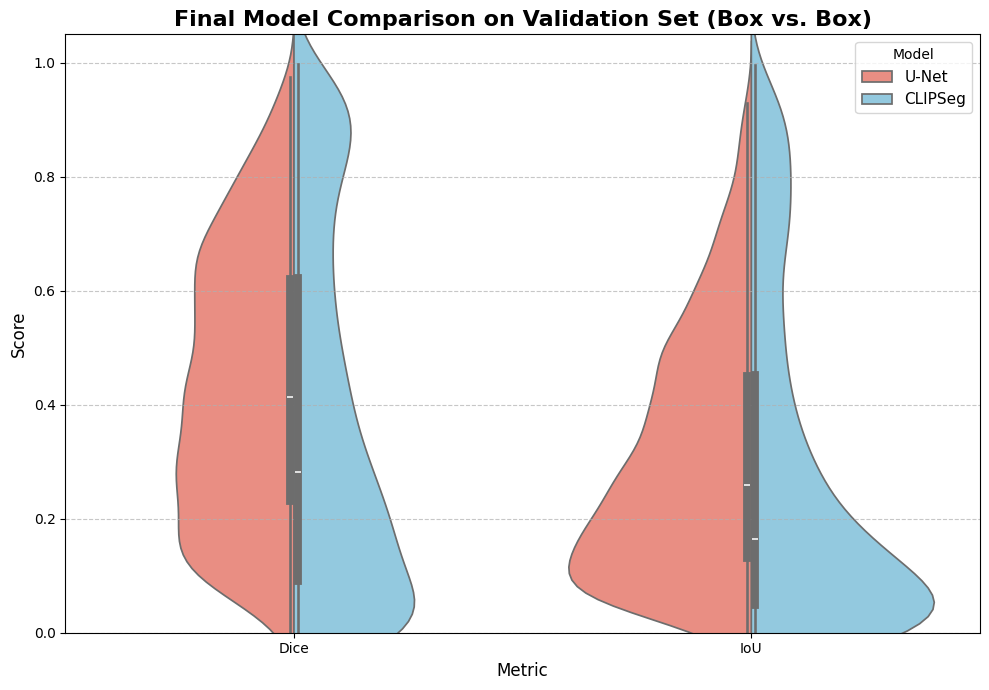

In [67]:
#Visualization of Validation Results

#  Prepare data into a "long-form" pandas DataFrame 
plot_data = []
for model_name, model_val_results in val_results.items():
    for metric_name, score_list in model_val_results.items():
        for score in score_list:
            plot_data.append({
                "Score": score,
                "Metric": metric_name,
                "Model": model_name
            })
df_val = pd.DataFrame(plot_data)

#  Create the violin plot 
if not df_val.empty:
    plt.figure(figsize=(10, 7))
    sns.violinplot(
        data=df_val,
        x="Metric",
        y="Score",
        hue="Model",
        split=True,
        inner="box",
        palette={"U-Net": "salmon", "CLIPSeg": "skyblue"}
    )
    
    plt.title('Final Model Comparison on Validation Set (Box vs. Box)', fontsize=16, fontweight='bold')
    plt.xlabel('Metric', fontsize=12)
    plt.ylabel('Score', fontsize=12)
    plt.ylim(0, 1.05)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title='Model', fontsize=11)
    plt.tight_layout()
    plt.show()
else:
    print("No validation data was found to plot.")

---

#### $Final$ $Folder$ $Structure$

---

```{}
/dataset/
├── train/
│   ├── source_images/
│   ├── target_images/
│   ├── masks/              
│   └── instructions/
│
├── val/
│   ├── source_images/
│   ├── target_images/
│   ├── masks/              
│   └── instructions/
│
├── test/
│   ├── source_images/
│   ├── target_images/
│   ├── masks/              
│   └── instructions/
│
├── predicted_token/
│   ├── train/
│   │   └── box/            
│   │
│   ├── val/
│   │   ├── raw/            
│   │   └── box/            
│   │
│   └── test/
│       ├── raw/            
│       └── box/            
│
└── predicted_clipseg/
    ├── test/
    │   ├── box/            
    │   └── raw/           
    │
    └── val/
        ├── box/            
        └── raw/            
```

---

#### $Conclusion$

---

*The final comparison on the validation set confirms that the custom `ConditionedUNet` is definitively superior to the CLIPSeg baseline, achieving a higher "Box vs. Box" Dice score (0.4292 vs. 0.3663) and a more reliable performance distribution. Based on this conclusive evidence, we select our U-Net as the final model and will proceed to the inpainting stage using its generated bounding box masks.*